0.003 dt

## mouse 3 = M12_2018-03-26_14-00-10_of

mouse with 6 neurons

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns
from scipy import signal
import statsmodels.api as sm
import math
from scipy.ndimage import gaussian_filter
from scipy import stats
from scipy.ndimage import gaussian_filter1d
from scipy.signal import resample
from utils.plotting import plot_trajectory
from utils.processing import rescale_coord
import statistics
import os 

In [8]:
qq = pd.read_pickle("sq_mouse_2_M5_2018-02-15_17-23-36_of.pkl")
qq.head(5)

,time,x,y,signal5,test_signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19,near_wall
0,0.000000,24.358125,35.531542,7.360600e-10,7.360600e-10,5.366552e-10,0.001145,-5.841809e-10,6.004241e-09,-6.724733e-09,-1.505201e-08,0.001388,5.0
9,0.030000,24.706802,37.921229,-8.340065e-10,-8.340065e-10,-5.997117e-10,-0.000026,5.757380e-10,1.286458e-06,6.125954e-07,6.469548e-09,0.001596,5.0
10,0.033333,23.343389,35.556739,8.465856e-10,8.465856e-10,6.076447e-10,0.000024,-5.749061e-10,4.210854e-06,2.446299e-06,-6.313018e-09,0.001538,5.0
11,0.036667,22.119962,33.459536,-8.595677e-10,-8.595677e-10,-6.157922e-10,-0.000021,5.740960e-10,1.228879e-05,7.411860e-06,6.194698e-09,0.001533,5.0
12,0.040000,21.119814,31.786562,8.729738e-10,8.729738e-10,6.241634e-10,0.000020,-5.733077e-10,3.285905e-05,2.080355e-05,-6.108476e-09,0.001487,0.0


In [9]:
qq = pd.read_pickle("resampled_df_check_mouse_2_M5_2018-02-15_17-23-36_of.pkl")
qq.head(5)

,time,x,y,signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19,near_wall,signal5second_try,signal15second_try,signal5try3
0,0.000000,31.404197,-36.597698,0.044743,0.019739,0.017624,0.024071,0.022978,0.022109,0.024222,0.023303,5.0,0.022567,0.024222,0.000001
1,0.003333,32.419092,-38.064982,0.086659,0.020051,0.017292,0.023951,0.024153,0.020838,0.022612,0.022806,50.0,0.023028,0.022612,0.000001
2,0.006667,33.155812,-39.116574,0.070304,0.019736,0.017615,0.024070,0.022961,0.022248,0.024250,0.070668,50.0,0.022564,0.024250,0.000001
3,0.010000,33.615284,-39.753567,0.067486,0.020054,0.017300,0.023951,0.024170,0.020691,0.022584,0.019456,50.0,0.023031,0.022584,0.000001
4,0.013333,33.813832,-40.000000,0.052200,0.019733,0.017607,0.024070,0.022943,0.022406,0.024279,0.025927,50.0,0.022561,0.024279,0.000001


#### -1. open original df (df_all) - did not touch

In [26]:
# это df c данными мышей
#data_frame_with_cells = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\sorted_clusters.pkl")
df_all = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\sorted_clusters.pkl")

In [8]:
#how many neurons in each session
df_all['session_id'].value_counts().head(11)

M11_2018-03-12_17-58-58_of    12
M5_2018-02-26_16-47-52_of      9
M5_2018-02-15_17-23-36_of      8
M5_2018-02-16_15-57-18_of      7
M5_2018-03-01_13-29-52_of      7
M5_2018-02-27_16-38-15_of      7
M13_2018-05-08_12-06-39_of     6
M13_2018-05-01_11-23-01_of     6
M13_2018-04-24_12-30-49_of     6
M7_2018-03-12_15-16-29_of      6
M12_2018-03-26_14-00-10_of     6
Name: session_id, dtype: int64

In [27]:
df_m12_10 = df_all.loc[df_all['session_id']=='M12_2018-03-26_14-00-10_of']
df_m12_10

,session_id,cluster_id,position_x,position_y,hd,firing_maps,firing_times,trajectory_hd,trajectory_x,trajectory_y,trajectory_times
3,M12_2018-03-26_14-00-10_of,4,"[3.769167045454546, 3.492345454545455, 3.49234...","[48.43157613636364, 49.00076931818182, 49.0007...","[129.28207574074236, 125.8086780542576, 125.80...","[[3.679618310403015, 3.4307883617976076, 3.124...","[1921.0, 2520.0, 3086.0, 103874.0, 265577.0, 2...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
4,M12_2018-03-26_14-00-10_of,5,"[4.4983375, 14.837142045454543, 38.162375, 60....","[94.24028068181816, 97.68251931818182, 99.8345...","[110.11542687261097, 43.32939731366332, 27.776...","[[0.35109411690039083, 0.346786068033974, 0.35...","[40916.0, 73892.0, 91596.0, 106838.0, 107074.0...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
10,M12_2018-03-26_14-00-10_of,11,"[3.769167045454546, 3.492345454545455, 3.49234...","[48.43157613636364, 49.00076931818182, 49.0007...","[129.28207574074236, 125.8086780542576, 125.80...","[[30.12558725981553, 29.85229457545096, 29.542...","[2231.0, 2683.0, 3057.0, 3374.0, 4172.0, 4460....",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
13,M12_2018-03-26_14-00-10_of,14,"[3.492345454545455, 3.0580363636363637, 3.1167...","[49.00076931818182, 50.16028068181818, 51.1087...","[125.8086780542576, 120.67442332774961, 120.90...","[[24.32889340798072, 24.288583681945763, 24.19...","[2772.0, 4820.0, 5917.0, 7403.0, 8344.0, 10403...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
16,M12_2018-03-26_14-00-10_of,17,"[93.84301136363638, 93.86104545454546, 93.7845...","[4.365764772727273, 4.217157954545455, 4.10625...","[-76.21545352238805, -72.32620358437994, -72.9...","[[0.07835881050409595, 0.06068925502809613, 0....","[8593226.0, 8593817.0, 8594875.0, 12027158.0, ...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...
17,M12_2018-03-26_14-00-10_of,18,"[8.285063636363637, 8.285063636363637, 8.46598...","[94.53057613636362, 94.53057613636362, 94.7269...","[46.165293046903024, 46.165293046903024, 43.37...","[[4.061547894065112, 3.6359590981152197, 3.275...","[59812.0, 60102.0, 60369.0, 63026.0, 63805.0, ...",0 117.599041 1 125.058732 2 ...,0 4.635214 1 4.113290 2 ...,0 47.569576 1 47.997292 2 ...,0 0.030712 1 0.078213 2 ...


check whether trajectory_x are equal in rows from same session

не все записи в df_all одинаково хороши. например, 1, 7 пустые

#### 0. Open preprocessed df - did not touch

In [16]:
# resampled_df = pd.read_pickle('')
signals = resampled_df.columns.to_list()
signals = [i for i in signals if 'signal' in i]

#df_m12_10 = pd.read_pickle('')

NameError: name 'resampled_df' is not defined

In [46]:
#10c - 11c
#3000 - 3300 семплов

In [4]:
resampled_df.head(3)

,time,x,y,signal5,test_signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19
0,0.000000,80.448095,94.429395,7.360600e-10,7.360600e-10,5.366552e-10,0.001145,-5.841809e-10,6.004241e-09,-6.724733e-09,-1.505201e-08,0.001388
1,0.003333,83.334852,100.075922,-7.457643e-10,-7.457643e-10,-5.430034e-10,-0.000208,5.831596e-10,-6.734242e-09,6.415071e-09,1.206106e-08,0.002278
2,0.006667,85.362475,104.114443,7.557327e-10,7.557327e-10,5.495016e-10,0.000113,-5.821588e-10,7.681460e-09,-6.356665e-09,-1.028462e-08,0.001919


In [7]:
resampled_df['time'].max()

700.0

In [5]:
resampled_df.isnull().sum().sum()

0

In [6]:
len(resampled_df)/300

700.0

#### 0.5. Functions

In [28]:
def occupMapNorm(df, binn, eps=0.1):
    """ 
    делаем df где будет понятно сколько было точек в каждом бине 
    соответсвуеющему данному интервалу х и данному интервалу у
    """
    xmin = df["x"].min() - eps
    xmax = df["x"].max() + eps
    binx = np.linspace(xmin, xmax, binn)
    x_cut = pd.cut(df.x, binx, right=False)

    ymin = df["y"].min() - eps
    ymax = df["y"].max() + eps
    biny = np.linspace(ymin, ymax, binn)
    y_cut = pd.cut(df.y, biny, right=False)

    dfn = df.groupby([x_cut, y_cut], observed=False).count()
    
    dfn = dfn.drop(columns=['x', 'y'])
    dfn = dfn.rename(columns={'time': 'Count'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    arrd = dd.replace(0, 1e-2).to_numpy()
    arrsrsr = np.sqrt(np.sqrt(np.sqrt(arrd)))

    return arrsrsr

def occupMapNotNorm(df, binn, eps=0.1):
    """ 
    делаем df где будет понятно сколько было точек в каждом бине 
    соответсвуеющему данному интервалу х и данному интервалу у
    """
    xmin = df["x"].min() - eps
    xmax = df["x"].max() + eps
    binx = np.linspace(xmin, xmax, binn)
    x_cut = pd.cut(df.x, binx, right=False)

    ymin = df["y"].min() - eps
    ymax = df["y"].max() + eps
    biny = np.linspace(ymin, ymax, binn)
    y_cut = pd.cut(df.y, biny, right=False)

    dfn = df.groupby([x_cut, y_cut], observed=False).count()
    
    dfn = dfn.drop(columns=['x', 'y'])
    dfn = dfn.rename(columns={'time': 'Count'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    arrd = dd.replace(0., 1).to_numpy()
    arrl = np.log(arrd)

    # arrl = df_minmax(arrl)
    return dd

#таблица с траекторией
def makebasDF(n):
    x = df_all['trajectory_x'].iloc[n] 
    y = df_all['trajectory_y'].iloc[n]
    time = df_all['trajectory_times'].iloc[n]
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])
    #df = df.loc[df['time']<=1000]
    #print(df)
    #plot_trajectory(df['x'],df['y'])
    return df

def makebasDF2(row):
    x = row['trajectory_x']
    y = row['trajectory_y']
    time = row['trajectory_times']
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])
    #df = df.loc[df['time']<=1000]
    #print(df)
    #plot_trajectory(df['x'],df['y'])
    return df

def makebasNpfromRow(row):
    x = row['trajectory_x']
    y = row['trajectory_y']
    time = row['trajectory_times']
    tr_np = np.dstack((time, x, y))
    return tr_np[0]

def rescale_coord(data, new_min, new_max):
    min_old_x, max_old_x = np.min(data), np.max(data)
    data_rescaled = ((data - min_old_x) / (max_old_x - min_old_x)) * (new_max - new_min) + new_min
    return data_rescaled

#near corner: code 50
#near wall (not near corner): code 5
#center: code 0
def sort_walls_area_simple(tr, border_tr, wall_percent=0.1): 
    ylen = border_tr['ymax'] - border_tr['ymin'] 
    xlen = border_tr['xmax'] - border_tr['xmin'] 
    xl = border_tr['xmin'] + xlen * wall_percent
    xr = border_tr['xmax'] - xlen * wall_percent
    yd = border_tr['ymin'] + ylen * wall_percent
    yu = border_tr['ymax'] - ylen * wall_percent

    tr['near_wall'] = 0.
    for i in range(len(tr)):     
        if tr['x'].iloc[i] < xl:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 50
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 50
            else:
                tr['near_wall'].iloc[i] = 5
        elif tr['x'].iloc[i] > xr:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 50
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 50
            else:
                tr['near_wall'].iloc[i] = 5
        elif tr['y'].iloc[i] > yu:
            tr['near_wall'].iloc[i] = 5
        elif tr['y'].iloc[i] < yd:
            tr['near_wall'].iloc[i] = 5
    return tr

def plotNs(df, t, signals_list, deltat=0.5):
    t1 = t-deltat/2
    t2 = t+deltat/2
    df = df.loc[(df['time']>=t1)&(df['time']<=t2)]
    plt.figure(figsize=(15,4))
    for s in signals_list:
        plt.plot(df['time'], df[s], label=s)
    plt.axvline(x=t, color='m')
    plt.legend()
    plt.show()
    return df

#def cutNs(df, t, signals_list, deltat=0.5):
    


#### 0.6 check all heatmaps - cluster 17

<AxesSubplot:xlabel='signal17', ylabel='Density'>

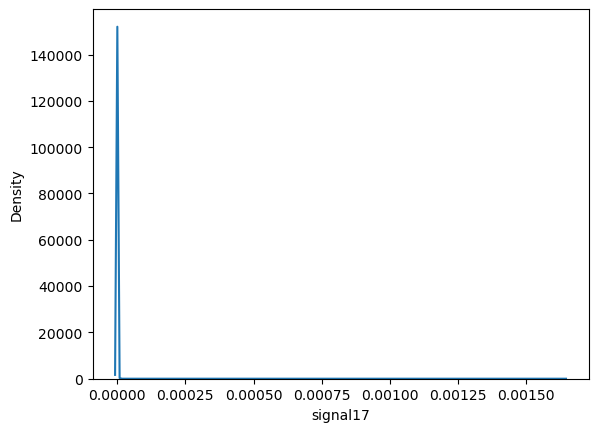

In [71]:
sns.kdeplot(data=resampled_df['signal17'])

выходит, можно считать спайками значения больше 0.001

In [72]:
#df_m12_10.iloc[7]

##### occupancy heatmap

In [73]:
def cut_jumps(df, xmax, xmin, ymax, ymin, show=True):
    """
    Simply drops samples with jumps onto the walls
    """
    dff = df[(df['x'] < xmax) & (df['x'] > xmin) & (df['y'] < ymax) & (df['y'] > ymin)]
    ind = range(0, len(dff))
    dff = dff.reindex(ind)
    if show:
        # plot_trajectory(dff['x'], dff['y'])
        print('not implemented')
    return dff

In [74]:
resampled_df = cut_jumps(resampled_df, 100, 0, 100, 0)

not implemented


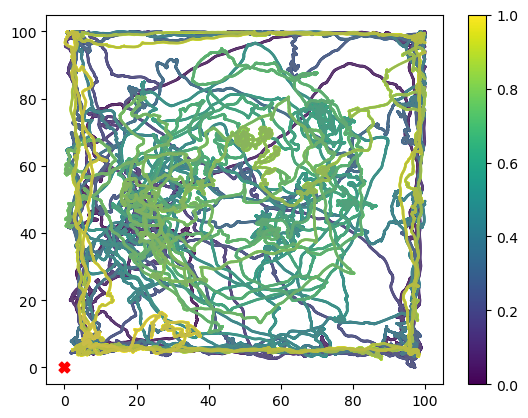

In [75]:
plot_trajectory(resampled_df['x'], resampled_df['y'])

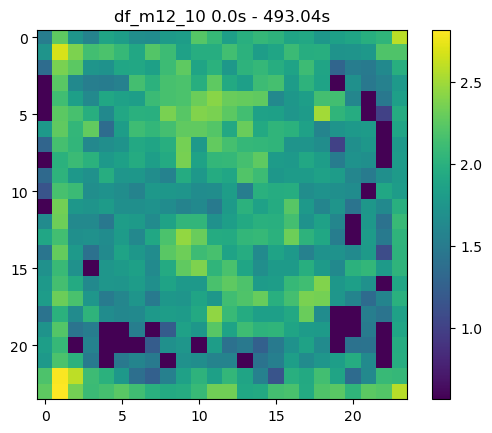

In [76]:
#occupancy map
k = 'df_m12_10'
k_add = ' '+str(round(resampled_df['time'].min(),2))+'s - '+str(round(resampled_df['time'].max(), 2))+'s' 
occ = occupMapNorm(resampled_df[['time', 'x', 'y']], binn=25)

# sns.heatmap(occ, square=True, xticklabels=False,
#             yticklabels=False, cmap='Blues')
#occ_s = fourier_gaussian(occ, 0.8, n=-1)
plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
# plt.savefig(d+'occ_map_'+k+k_add2+'.png')
plt.show()

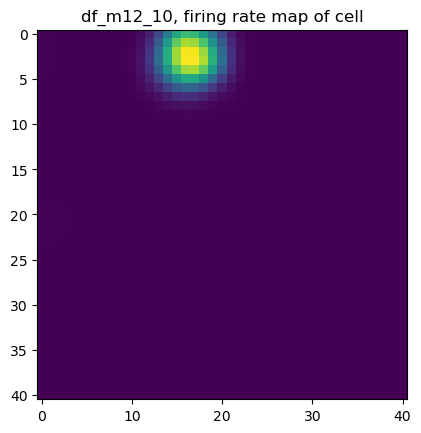

In [79]:
i=17
hm = df_m12_10.loc[df_m12_10['cluster_id']==i]['firing_maps'].values[0]
# hm_clusters['signal'+str(i)] = hm
plt.imshow(hm)
plt.title( k+ ", firing rate map of cell" ) 
#plt.savefig('C:\\Users\\Lenovo\\1navigation\\output\\'+k+'hm.png')
plt.show() 

In [81]:
print(resampled_df['signal17'].isna().sum())
print(len(resampled_df))

2088
147912


In [82]:
resampled_df = resampled_df.dropna()
print(len(resampled_df))

145824


###### если делать количество точек выше какого-то порога

In [85]:
df_spec

,time,x,y,signal17
10930,36.433333,95.622907,6.513342,0.001034
10931,36.436667,95.645058,6.447821,0.001294
10932,36.440000,95.669149,6.381776,0.001485
10933,36.443333,95.691092,6.314162,0.001591
10934,36.446667,95.706375,6.243441,0.001630
10935,36.450000,95.711482,6.168265,0.001637
10936,36.453333,95.705024,6.088312,0.001635
10937,36.456667,95.688205,6.004976,0.001615
10938,36.460000,95.664460,5.921652,0.001543
10939,36.463333,95.638382,5.843454,0.001393


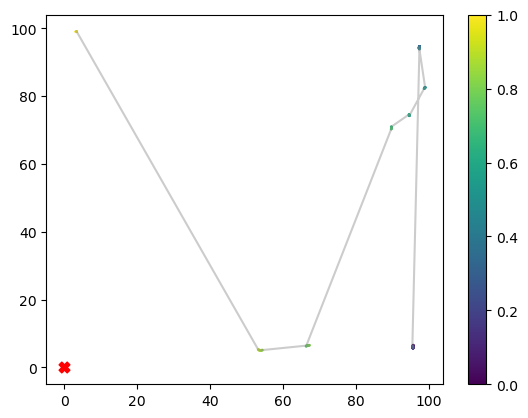

In [93]:
plot_trajectory(df_spec['x'],df_spec['y'])

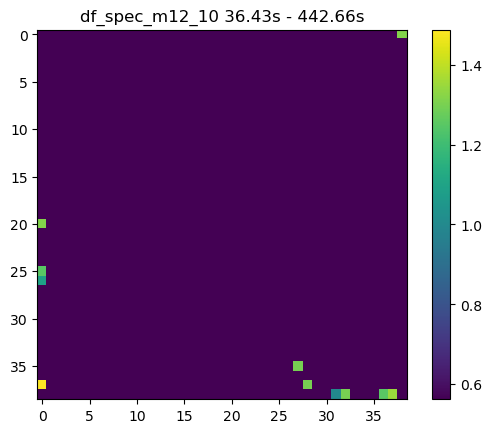

In [92]:
df_spec = resampled_df.loc[resampled_df['signal17']>=0.0005]
k = 'df_spec_m12_10'
k_add = ' '+str(round(df_spec['time'].min(),2))+'s - '+str(round(df_spec['time'].max(), 2))+'s' 
occ = occupMapNorm(df_spec[['time', 'x', 'y']], binn=40)
plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
k_add2 = '_'+str(round(df_spec['time'].min(),2))+'s_ '+str(round(df_spec['time'].max(), 2))+'s'
plt.show()


In [45]:
smoothed_matrix

array([[0.96484801, 1.23201626, 1.3696916 , ..., 3.22945651, 3.58116512,
        3.75985169],
       [2.05515627, 2.38409274, 2.45269951, ..., 3.27603873, 3.46405776,
        3.52865471],
       [3.07299901, 3.2530434 , 3.07096923, ..., 3.21292966, 3.50482856,
        3.54794376],
       ...,
       [3.32458285, 3.3940331 , 3.36321573, ..., 3.24642681, 3.64037693,
        3.47628644],
       [2.73707045, 3.08104999, 3.2044252 , ..., 3.5738264 , 4.07902959,
        3.99365726],
       [1.84042708, 2.46857137, 2.69344514, ..., 4.01508457, 4.50390828,
        4.53034185]])

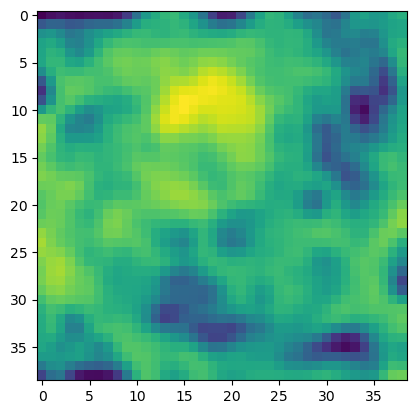

In [50]:
smoothed_matrix = gaussian_filter(occ, sigma=1)
plt.imshow(smoothed_matrix)

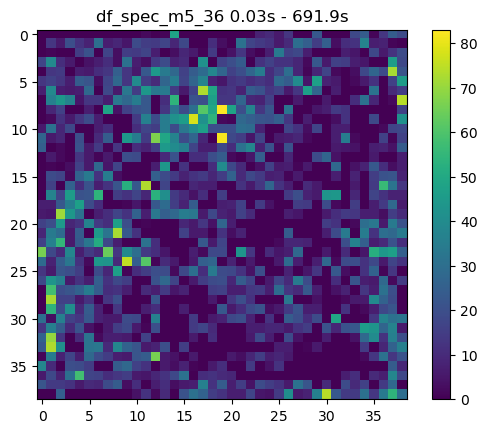

In [73]:
df_spec = resampled_df.loc[resampled_df['signal19']>=0.0015]
k = 'df_spec_m5_36'
k_add = ' '+str(round(df_spec['time'].min(),2))+'s - '+str(round(df_spec['time'].max(), 2))+'s' 
occ3 = occupMapNotNorm(df_spec[['time', 'x', 'y']], binn=40)
plt.imshow(occ3) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
k_add2 = '_'+str(round(df_spec['time'].min(),2))+'s_ '+str(round(df_spec['time'].max(), 2))+'s'
plt.show()

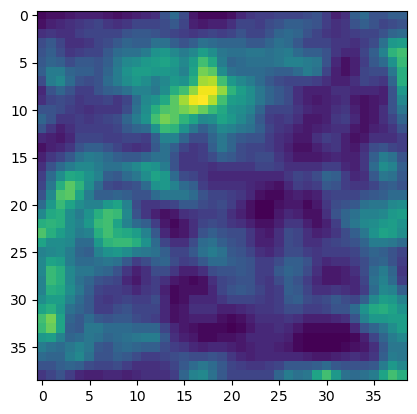

In [74]:
smoothed_matrix3 = gaussian_filter(occ3, sigma=1)
plt.imshow(smoothed_matrix3)

##### если брать среднюю активность нейрона в этой точке - что-то не так

In [63]:
def occupMean(df, binn, s='signal19', eps=0.1):
    """ 
    делаем df где будет понятно сколько было точек в каждом бине 
    соответсвуеющему данному интервалу х и данному интервалу у
    """
    xmin = df["x"].min() - eps
    xmax = df["x"].max() + eps
    binx = np.linspace(xmin, xmax, binn)
    x_cut = pd.cut(df.x, binx, right=False)

    ymin = df["y"].min() - eps
    ymax = df["y"].max() + eps
    biny = np.linspace(ymin, ymax, binn)
    y_cut = pd.cut(df.y, biny, right=False)

    dfn = df.groupby([x_cut, y_cut], observed=False).mean()
    
    dfn = dfn.drop(columns=['x', 'y', 'time'])
    dfn = dfn.rename(columns={s: 'mean'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    arrd = dd.replace(0., 1).to_numpy()
    arrl = np.log(arrd)

    # arrl = df_minmax(arrl)
    return arrl

In [ ]:
resampled_df

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22940\2187721434.py:27: RuntimeWarning: invalid value encountered in log
  arrl = np.log(arrd)


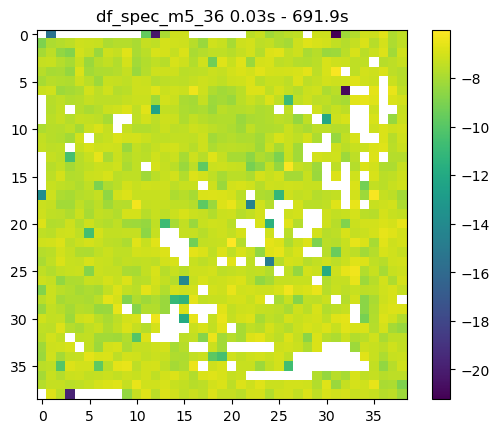

In [65]:
occ_n_m = occupMean(resampled_df[['time', 'x', 'y', 'signal19']], binn=40)
plt.imshow(occ_n_m) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
k_add2 = '_'+str(round(df_spec['time'].min(),2))+'s_ '+str(round(df_spec['time'].max(), 2))+'s'
plt.show()


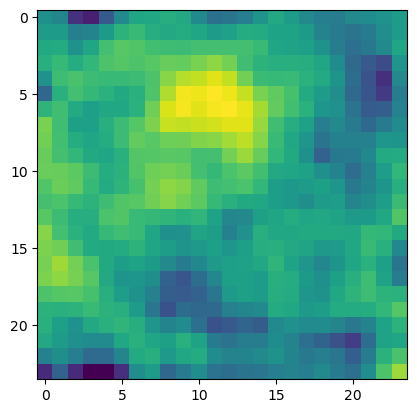

In [54]:
smoothed_matrix2 = gaussian_filter(occ_n_m, sigma=0.7)
plt.imshow(smoothed_matrix2)

#### 0.7 grid cells maps

##### mouse 2

In [40]:
hm_clusters = {}
for i in df_m12_10['cluster_id']:
    hm = df_m12_10.loc[df_m12_10['cluster_id']==i]['firing_maps'].values[0]
    hm_clusters['signal'+str(i)] = hm

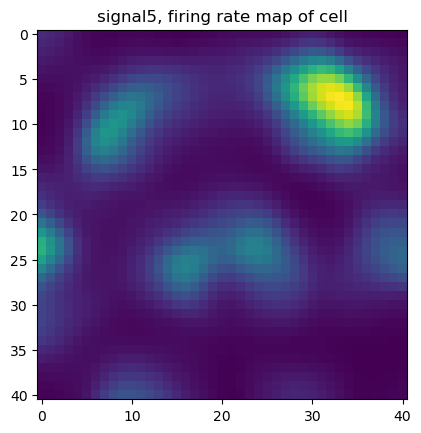

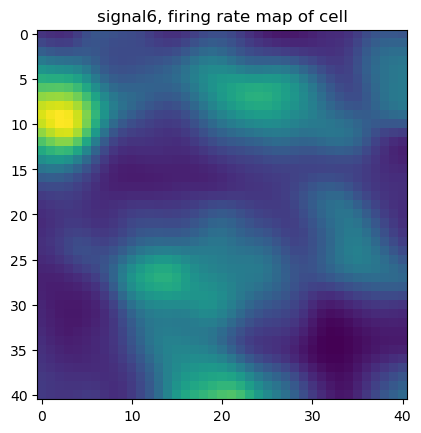

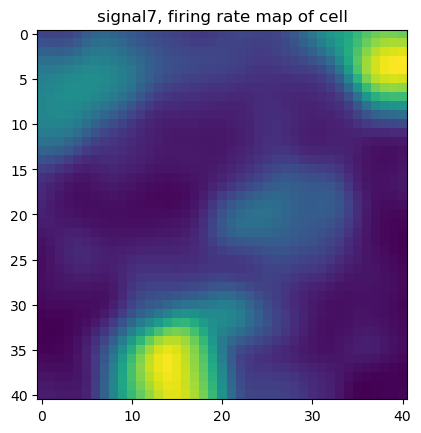

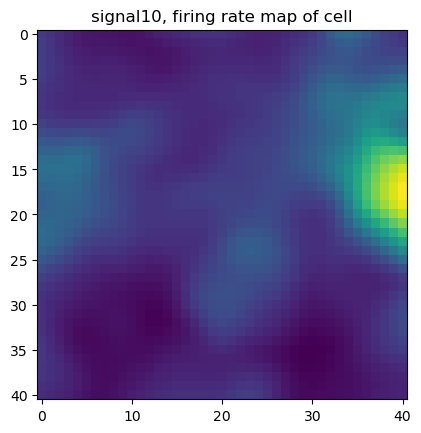

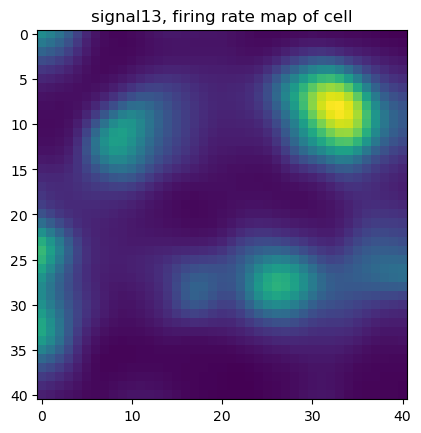

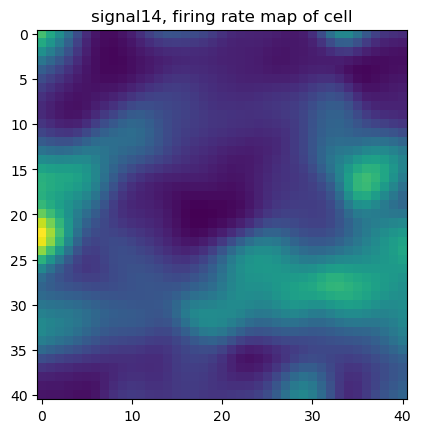

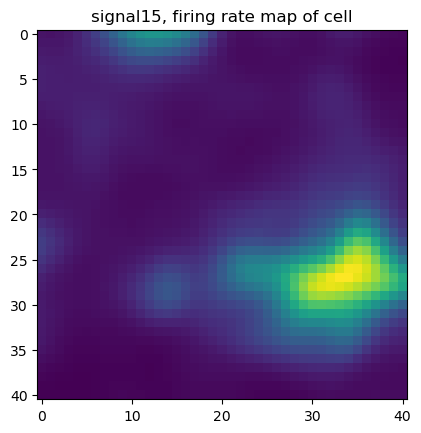

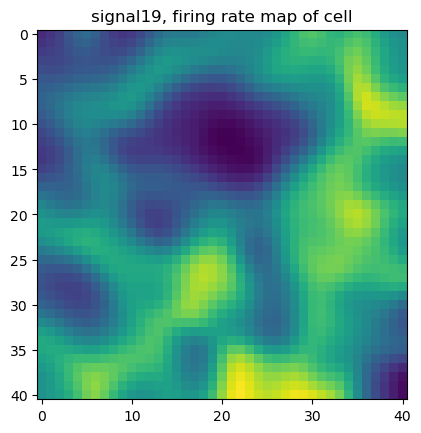

In [45]:
for k, hm in hm_clusters.items():
    plt.imshow(hm)
    plt.title( k+ ", firing rate map of cell" ) 
    #plt.savefig('C:\\Users\\Lenovo\\1navigation\\output\\'+k+'hm.png')
    plt.show() 

##### best mice

In [51]:
mice_many_neurons = df_all['session_id'].value_counts().head(15).index.to_numpy()

In [55]:
df_all.head(2)

,session_id,cluster_id,position_x,position_y,hd,firing_maps,firing_times,trajectory_hd,trajectory_x,trajectory_y,trajectory_times
11,M0_2017-11-15_14-52-15_of,12,"[1.7178965909090904, 1.1862602272727274, 1.186...","[7.2429774999999985, 3.7494206818181817, 3.749...","[156.66475083349192, 137.38600140667376, 137.3...","[[3.374810282884154, 3.3894260264610554, 3.394...","[160.0, 11669.0, 12143.0, 15903.0, 19129.0, 25...",0 156.664751 1 148.394416 2 ...,0 1.717897 1 1.804099 2 ...,0 7.242977 1 6.787384 2 ...,0 0.036803 1 0.101238 2 ...
5,M0_2017-11-16_14-45-03_of,6,"[nan, 5.953374318181819, 5.953374318181819, 5....","[nan, 3.362840568181818, 3.362840568181818, 3....","[nan, 4.399812464254153, 4.399812464254153, 9....","[[6.799888229247266, 6.926669133283486, 7.2069...","[649.0, 3669.0, 4745.0, 7432.0, 7936.0, 8293.0...",0 NaN 1 NaN 2 ...,0 NaN 1 NaN 2 ...,0 NaN 1 NaN 2 ...,0 1848.274306 1 1848.399055 2 ...


In [ ]:
import os 
for sess in mice_many_neurons:
    df_m_n = df_all.loc[df_all['session_id']==sess] 
    hm_clusters = {}
    for i in df_m_n['cluster_id']:
        hm = df_m_n.loc[df_m_n['cluster_id']==i]['firing_maps'].values[0]
        hm_clusters['signal'+str(i)] = hm
    
    os.mkdir('C:\\Users\\Lenovo\\1navigation\\output\\'+sess) 
    for k, hm in hm_clusters.items():
        plt.imshow(hm)
        plt.title( sess+' '+k+ ", firing rate map of cell" ) 
        plt.savefig('C:\\Users\\Lenovo\\1navigation\\output\\'+sess+'\\'+k+'hm.png')
        #plt.show() 

#### 1. preprocessing

##### 1.1 open firing time and trajectory time

In [32]:
dat1=df_m12_10.iloc[4]
#чтобы выбрать другой нейрон, надо просто поменять номер iloc
traj_time = dat1['trajectory_times']
print('sampling rate of trajectory:',len(traj_time)/max(traj_time))
#sampling rate is 30 samples / sec, time is in seconds
fire_time_old = dat1['firing_times']
#fire_time = dat1['firing_times'].iloc[0] / 30000

sampling rate of trajectory: 30.08306487284134


##### 1.15 блин вроде это ненужное
old: evaluate time interval in which mouse was in square open field

In [8]:
#cut_df = makebasDF2(dat1)

In [9]:
#cut_df['time'].max()

##### 1.2 cut neuro recording, smoothing of neuro recording, compare dt in trejectory and neuro recordings

In [33]:
#sampling rate of fire_time
max(fire_time_old) / max(traj_time)

29210.243718703325

In [34]:


sigm = 0.01 * 30000
#0.015 too slow
fire_time_old= fire_time_old.astype(int)
l = max(fire_time_old) + 1
signal = np.zeros(l)
signal[fire_time_old] = 1
sign_time = np.arange(len(signal))
sign_time = sign_time / 30000

#compare dt in trejectory and neuro recordings
print('signal time')
print('min',min(sign_time))
print('max',max(sign_time))
print('dt',max(sign_time)/len(sign_time), '\n')
print('trajectory time')
print('min',min(traj_time))
print('max',max(traj_time))
print('dt', max(traj_time)/len(traj_time))




signal time
min 0.0
max 1894.1029666666666
dt 3.333333274671734e-05 

trajectory time
min 0.03071226666150717
max 1945.3137586666614
dt 0.033241293871715476


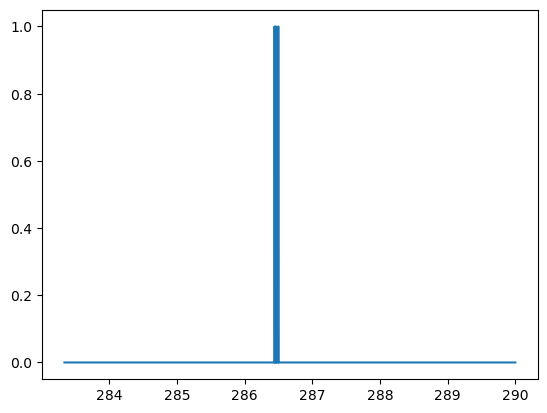

In [45]:
#cut signal to required interval
sign_np = np.dstack((sign_time, signal))
sign_np = sign_np[0]
mask = (sign_np[:, 0] >= 250) & (sign_np[:, 0] <= 750)
sign_np = sign_np[mask, :]
sign_time = sign_np[:, 0]
signal = sign_np[:, 1]

plt.plot(sign_time[1000000:1200000],signal[1000000:1200000])

In [47]:
signal

array([0., 0., 0., ..., 0., 0., 0.])

In [48]:
%time signal = gaussian_filter1d(signal, sigm)

CPU times: total: 24.2 s
Wall time: 26.1 s


In [49]:
print(len(sign_time))
print(len(signal) / 30000)
len(sign_time) / 30000

15000001
500.0000333333333


500.0000333333333

In [15]:
# print(max(sign_time))
# #old_signal = signal.copy()
# plt.plot(sign_time[410000:10100000],signal[410000:10100000])

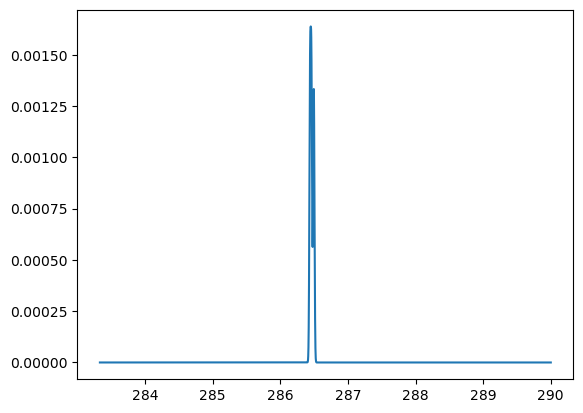

In [50]:
plt.plot(sign_time[1000000:1200000],signal[1000000:1200000])

##### 1.3 resample neuro recording and trajectory recording to 0.00333

cut trajectory

In [51]:
tr_df = makebasDF2(dat1)
tr_np = tr_df.to_numpy()
mask = (tr_np[:, 0] >= 250) & (tr_np[:, 0] <= 1250)
tr_np = tr_np[mask, :]

In [52]:
signal

array([0., 0., 0., ..., 0., 0., 0.])

In [54]:
#new_dt = 0.00333
num_new_points = int(len(sign_time)/100)
#блин мне порoю не хватает RAM для этой ячейки
print(signal.shape)
%time new_sign = resample(signal, num_new_points, axis=0)
#print(new_sign.shape)

(15000001,)
CPU times: total: 5.36 s
Wall time: 5.86 s


In [64]:
3130000 / 30000 * 300

31300.0

In [60]:
sign_time = np.arange(len(new_sign))
sign_time = sign_time / 300
print(max(sign_time))

499.99666666666667


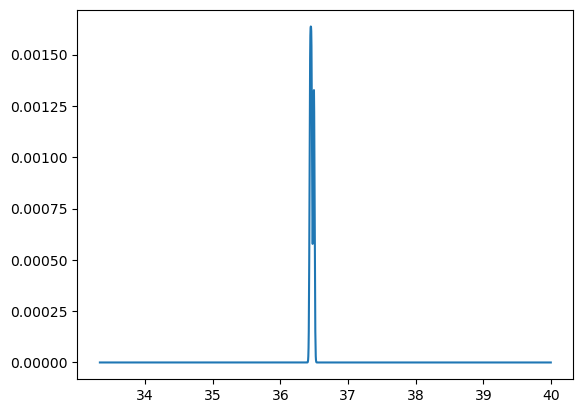

In [61]:
plt.plot(sign_time[10000:12000],new_sign[10000:12000])

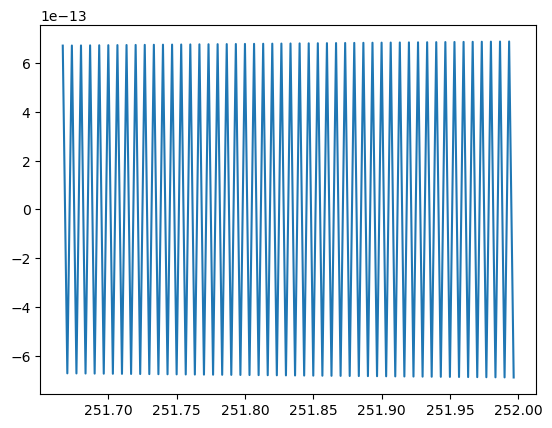

In [62]:
#хз почему
plt.plot(sign_time[75500:75600],new_sign[75500:75600])

In [63]:
len(sign_time) / max(sign_time)

300.00200001333343

In [15]:
# resampled_df['signal'+str(int(dat1['cluster_id']))+'try3'] = rescale_coord(new_sign[0:150000], 0, 0.1)
# resampled_df

In [64]:
max(sign_time)

499.99666666666667

In [65]:
resampled_dfnp = resample(tr_np[:, 1:], num_new_points, axis=0)
new_time = np.linspace(0, max(sign_time), num_new_points)

In [66]:
resampled_dfnp

array([[20.98947386, 53.58729205],
       [20.54404884, 56.16520564],
       [20.40452528, 57.04261281],
       ...,
       [23.69410467, 38.19980897],
       [22.66918878, 44.01538447],
       [21.72482448, 49.38713051]])

In [67]:

resampled_dfnp = resample(tr_np[:, 1:], num_new_points, axis=0)
new_time = np.linspace(0, max(sign_time), num_new_points)
#new_sign = resample(sign_np[:, 1:], num_new_points, axis=0)
resampled_df = pd.DataFrame({'time': new_time,
                                     'x': resampled_dfnp[:, 0], 
                                     'y': resampled_dfnp[:, 1],
                                    'signal'+str(int(dat1['cluster_id'])):new_sign})


In [69]:
resampled_df.to_pickle('M12_2018-03-26_14-00-10_of_sign17.pkl')

# не иду по коду начиная с этого момента

##### 1.4 add the rest neural recordings -  не иду по коду начиная с этого момента

In [19]:
resampled_df = pd.read_pickle('')
signals = resampled_df.columns.to_list()
signals = [i for i in signals if 'signal' in i]
df_sq = resampled_df.copy()

df_m12_10 = pd.read_pickle('')
df_m12_10 = df_m12_10.reset_index(drop=True)

In [109]:
#print(len(resampled_df)/700)

###### 1.4.1 add other signal

In [39]:
numb = 7

signal time
min 0.0
max 1375.4603333333334
dt 3.3333332525522994e-05 



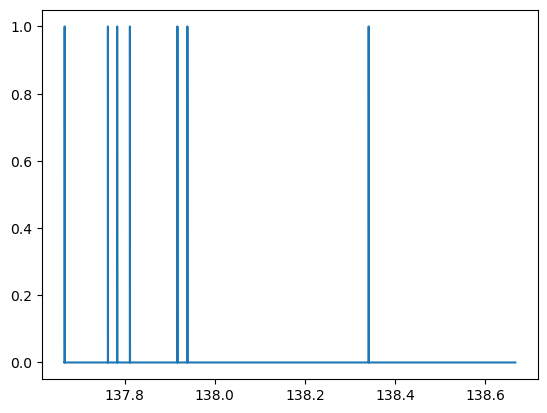

CPU times: total: 27.5 s
Wall time: 32 s
700.0


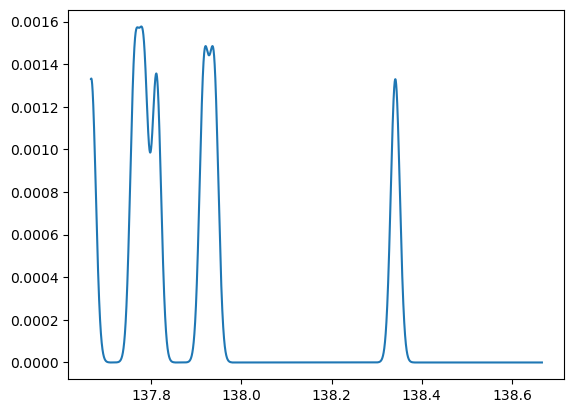

In [40]:
#firing time open
fire_time_old = df_m12_10.iloc[numb]['firing_times']
time_cut = 700

#smoothing
sigm = 0.01 * 30000
fire_time_old= fire_time_old.astype(int)
l = max(fire_time_old) + 1
signal = np.zeros(l)
signal[fire_time_old] = 1
sign_time = np.arange(len(signal))
sign_time = sign_time / 30000

print('signal time')
print('min',min(sign_time))
print('max',max(sign_time))
print('dt',max(sign_time)/len(sign_time), '\n')

sign_np = np.dstack((sign_time, signal))
sign_np = sign_np[0]
mask = (sign_np[:, 0] >= 0) & (sign_np[:, 0] <= time_cut)
sign_np = sign_np[mask, :]
sign_time = sign_np[:, 0]
signal = sign_np[:, 1]

plt.plot(sign_time[4130000:4160000],signal[4130000:4160000])
#plt.plot(sign_time[3130000:3190000],signal[3130000:3190000])
plt.show()

%time signal = gaussian_filter1d(signal, sigm)

#plot

print(max(sign_time))
plt.plot(sign_time[4130000:4160000],signal[4130000:4160000])
#plt.plot(sign_time[3130000:3190000],signal[3130000:3190000])
plt.show()




In [41]:
num_new_points = int(len(sign_time)/100)
print('should be equal')
print(num_new_points)
print(len(resampled_df))

should be equal
210000
210000


CPU times: total: 5.28 s
Wall time: 6.34 s


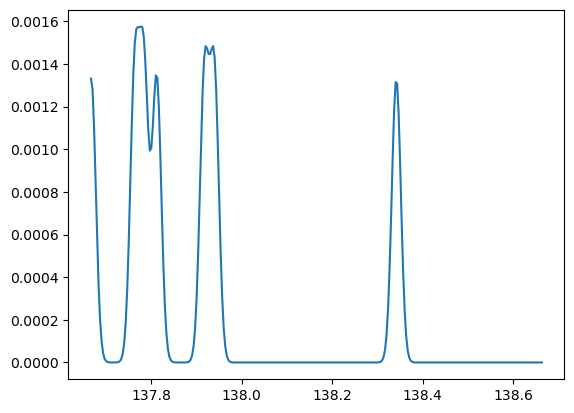

In [42]:
#блин мне порою не хватает RAM для этой ячейки
#нужно взять не signal а sign_np!!!!!!!!!!!!!!!!!!!!!!!!! TODO 
%time new_sign = resample(signal, num_new_points, axis=0)

sign_time = np.arange(len(new_sign))
sign_time = sign_time / 300
plt.plot(sign_time[41300:41600],new_sign[41300:41600])
#plt.plot(sign_time[31300:31900],new_sign[31300:31900])

In [43]:
#resampled_dfnp = resample(tr_np[:, 1:], num_new_points, axis=0)
#new_time = np.linspace(0, time_cut,num_new_points)
#new_sign = resample(sign_np[:, 1:], num_new_points, axis=0)
resampled_df['signal'+str(int(df_m12_10.iloc[numb]['cluster_id']))] = new_sign
resampled_df

,time,x,y,signal5,test_signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19
0,0.000000,80.448095,94.429395,7.360600e-10,7.360600e-10,5.366552e-10,0.001145,-5.841809e-10,6.004241e-09,-6.724733e-09,-1.505201e-08,0.001388
1,0.003333,83.334852,100.075922,-7.457643e-10,-7.457643e-10,-5.430034e-10,-0.000208,5.831596e-10,-6.734242e-09,6.415071e-09,1.206106e-08,0.002278
2,0.006667,85.362475,104.114443,7.557327e-10,7.557327e-10,5.495016e-10,0.000113,-5.821588e-10,7.681460e-09,-6.356665e-09,-1.028462e-08,0.001919
3,0.010000,86.535004,106.551086,-7.659771e-10,-7.659771e-10,-5.561554e-10,-0.000077,5.811785e-10,-8.965903e-09,6.550805e-09,9.121647e-09,0.001870
4,0.013333,86.903373,107.480547,7.765101e-10,7.765101e-10,5.629711e-10,0.000058,-5.802190e-10,1.082135e-08,-7.068558e-09,-8.310035e-09,0.001601
...,...,...,...,...,...,...,...,...,...,...,...,...
209995,699.986667,56.251388,48.021378,-6.911272e-10,-6.911272e-10,-5.069800e-10,0.000864,5.895877e-10,-3.930604e-09,7.939284e-07,7.278009e-06,0.001296
209996,699.990000,61.893157,58.780218,6.996679e-10,6.996679e-10,5.126558e-10,0.001141,-5.884669e-10,4.218235e-09,-1.811910e-09,2.377517e-06,0.001272
209997,699.993333,67.316312,69.145961,-7.084223e-10,-7.084223e-10,-5.184565e-10,0.001683,5.873656e-10,-4.553107e-09,9.899043e-09,5.986523e-07,0.000981
209998,699.996667,72.324661,78.747583,7.173993e-10,7.173993e-10,5.243868e-10,0.001857,-5.862841e-10,4.948461e-09,-8.417719e-09,-3.481220e-08,0.000891


In [44]:
resampled_df.to_pickle('')

###### 1.4.2 add signal 12

CPU times: total: 59.6 s
Wall time: 1min 3s
1471.2119666666667


NameError: name 'makebasNpfromRow' is not defined

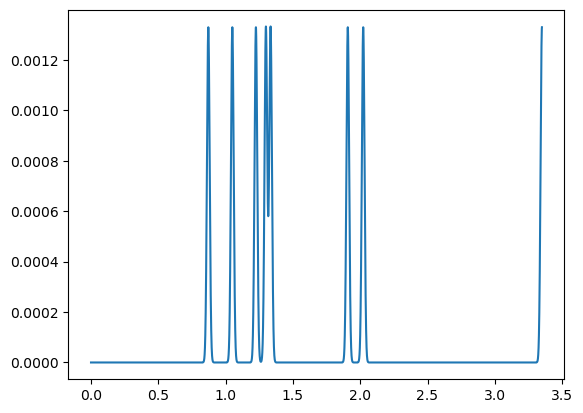

In [7]:
cl = 15

#firing time open
fire_time_old = df_m13_20.loc[df_m13_20['cluster_id']==cl].iloc[0]['firing_times']

#smoothing
sigm = 0.01 * 30000
fire_time_old= fire_time_old.astype(int)
l = max(fire_time_old) + 1
signal = np.zeros(l)
signal[fire_time_old] = 1
%time signal = gaussian_filter1d(signal, sigm)

#plot
sign_time = np.arange(len(signal))
sign_time = sign_time / 30000
print(max(sign_time))
plt.plot(sign_time[:100500],signal[:100500])

#cut time to interval 0s-1400s
tr_np = makebasNpfromRow(df_m13_20.iloc[0])
mask = (tr_np[:, 0] >= 0) & (tr_np[:, 0] <= 1400)
tr_np = tr_np[mask, :]

sign_np = np.dstack((sign_time, signal))
sign_np = sign_np[0]
#время от 0 с до 1400
mask = (sign_np[:, 0] >= 0) & (sign_np[:, 0] <= 1400)
sign_np = sign_np[mask, :]


In [9]:
#cut time to interval 0s-1400s
tr_np = makebasNpfromRow(df_m13_20.iloc[0])
mask = (tr_np[:, 0] >= 0) & (tr_np[:, 0] <= 1400)
tr_np = tr_np[mask, :]

sign_np = np.dstack((sign_time, signal))
sign_np = sign_np[0]
#время от 0 с до 1400
mask = (sign_np[:, 0] >= 0) & (sign_np[:, 0] <= 1400)
sign_np = sign_np[mask, :]

In [10]:
new_dt = 0.00333
num_new_points = int (1400 / new_dt)

#блин мне порю не хватает RAM для этой ячейки

%time new_sign = resample(sign_np[:,1], num_new_points, axis=0)

resampled_dfnp = resample(tr_np[:, 1:], num_new_points, axis=0)
new_time = np.linspace(0, 1400, num_new_points)
#new_sign = resample(sign_np[:, 1:], num_new_points, axis=0)
resampled_df['signal'+str(cl)] = new_sign

CPU times: total: 18.6 s
Wall time: 54.3 s


In [11]:
resampled_df

,time,x,y,signal17,signal6,signal12,signal15
0,0.00000,95.075018,7.693317,6.071836e-10,0.001022,0.000077,-1.605840e-12
1,0.00333,100.186379,6.587274,-6.029137e-10,-0.000185,0.000176,-7.956076e-13
2,0.00666,103.843984,5.798661,5.987792e-10,0.000100,0.000274,3.150126e-12
3,0.00999,106.052412,5.325915,-5.947755e-10,-0.000068,0.000471,-5.459456e-12
4,0.01332,106.896233,5.150192,5.908982e-10,0.000051,0.000720,7.725268e-12
...,...,...,...,...,...,...,...
420415,1399.98668,53.109383,16.836155,-6.307439e-10,0.001921,0.000391,1.438331e-11
420416,1399.99001,62.833622,14.709746,6.257187e-10,0.001879,0.000209,-1.171839e-11
420417,1399.99334,72.204922,12.664988,-6.208559e-10,0.002085,0.000096,9.110289e-12
420418,1399.99667,80.887685,10.774176,6.161495e-10,0.001992,0.000049,-6.556856e-12


In [12]:
resampled_df.to_pickle('new_M11_2018-03-12_17-58-58_of.pkl')

#### 1.5 check position x and trajectory x

нормально совпадают

In [168]:
#df_m13_58.head(1)

In [169]:
#len(df_m13_58.iloc[1]['position_x'])

In [153]:
f_t_sec = df_m13_58.iloc[1]['firing_times'] / 30000
f_t_sec = f_t_sec[f_t_sec <= 1050]

In [165]:
x = df_m13_58.iloc[1]['position_x']
x = x[:len(f_t_sec)]
y = df_m13_58.iloc[1]['position_y']
y = y[:len(f_t_sec)]

In [174]:
df_fire = pd.DataFrame({'t': f_t_sec, 'p_x': x, 'p_y': y})
np_fire = df_fire.to_numpy()

возьмем первые 50 секунд

In [185]:
tr_time = resampled_df['time'].to_numpy()

lil_tr_time = tr_time[tr_time <=50]

lil_f_t_sec = f_t_sec[f_t_sec <=50]

In [220]:
intersection_points=[np.where(abs(lil_tr_time - i) <= 0.01)[0][0] for i in lil_f_t_sec]

In [228]:
lil_df_fire = df_fire.loc[df_fire['t']<=50]
lil_df_tr = resampled_df.loc[resampled_df['time']<=50]

In [253]:
my_tr_fire = lil_df_tr.iloc[intersection_points]
len(my_tr_fire)

255

In [261]:
type(my_tr_fire.head(50)['x'].iloc[0])

numpy.float64

In [264]:
df_fire.head(50)['p_x'].to_numpy()

array([73.00179114, 70.07162068, 68.73066614, 34.76643886, 30.90557523,
       29.95004114, 22.65066614, 22.65066614, 18.18079455,  7.15172523,
        6.81371273,  6.11445477,  5.73187409,  6.54208432, 17.45139682,
       27.36451841, 27.82013205, 36.96546159, 36.96546159, 41.40506386,
       41.95016614, 44.31054114, 44.89487068, 46.48231386, 46.49110932,
       46.49110932, 47.0628025 , 48.42149568, 48.76937068, 51.38909795,
       50.78535932, 50.26547295, 50.05465477, 50.11359795, 49.91897295,
       49.91897295, 49.59632523, 48.88160932, 47.07821159, 47.47764341,
       47.12218886, 51.46832523, 90.96651841, 90.95127977, 91.0328025 ,
       91.25890477, 92.76454114, 94.6196775 , 94.0456775 , 93.97458659])

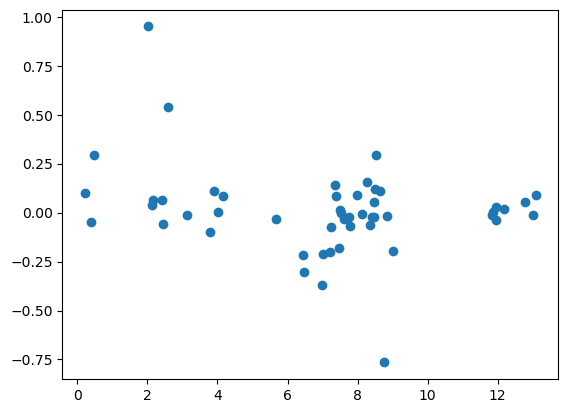

In [265]:
plt.scatter(my_tr_fire.head(50)['time'], my_tr_fire.head(50)['x'].to_numpy() - df_fire.head(50)['p_x'].to_numpy())

In [247]:
df_fire.head(5)

,t,p_x,p_y
0,0.222833,73.001791,7.366909
1,0.409433,70.071621,4.916623
2,0.467033,68.730666,4.480326
3,2.023167,34.766439,6.864788
4,2.134433,30.905575,6.570990


In [236]:
#intersection_points

#### 2.check neuro recording in 1 session

##### 2.1. plot recording of neurons in different intervals of recording, rescale signals

In [9]:
signals = resampled_df.columns.to_list()
signals = [i for i in signals if 'signal' in i]

In [59]:
# for s in signals:
#     resampled_df[s] = rescale_coord(resampled_df[s], 0, 0.1)

In [52]:
resampled_df.columns

Index(['time', 'x', 'y', 'signal5', 'test_signal5', 'signal6', 'signal7',
       'signal10', 'signal13', 'signal14', 'signal15', 'signal19'],
      dtype='object')

In [46]:
# rang = resampled_df.iloc[31300:31900]
# for s in ['signal5', 'signal6']:
#     plt.plot(rang['time'], rang[s], label=s)
# plt.legend(loc='upper right')

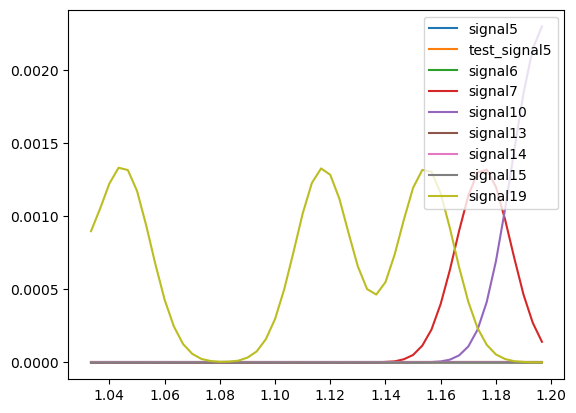

In [10]:
rang = resampled_df.iloc[310:360]
for s in signals:
    plt.plot(rang['time'], rang[s], label=s)
plt.legend(loc='upper right')

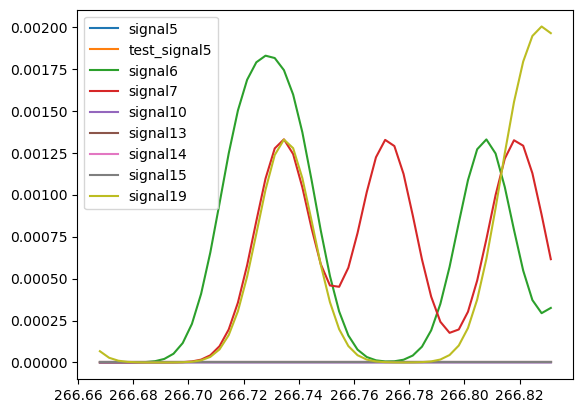

In [11]:
rang = resampled_df.iloc[80000:80050]
for s in signals:
    plt.plot(rang['time'], rang[s], label=s)
plt.legend(loc='upper left')

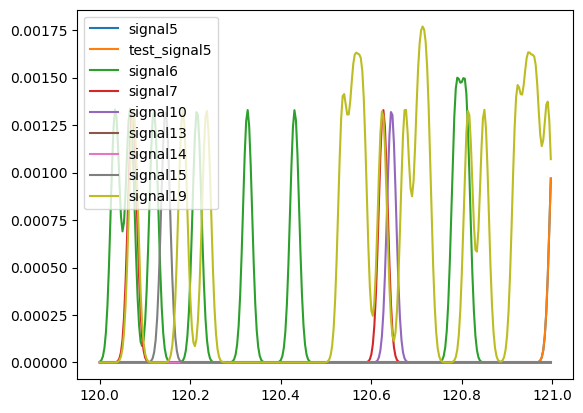

In [55]:
rang = resampled_df.iloc[36000:36300]
for s in signals:
    plt.plot(rang['time'], rang[s], label=s)
plt.legend(loc='upper left')

In [56]:
len(resampled_df)

210000

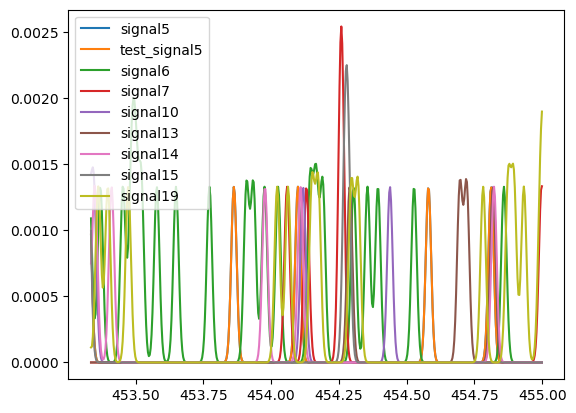

In [57]:
rang = resampled_df.iloc[136000:136500]
for s in signals:
    plt.plot(rang['time'], rang[s], label=s)
plt.legend(loc='upper left')

In [59]:
for s in signals:
    print(s)
    print(max(resampled_df[s]))

signal5
0.0060614711968525045
test_signal5
0.0060614711968525045
signal6
0.0037026179049051296
signal7
0.0035058290469252265
signal10
0.006237233113117044
signal13
0.0066525511924723215
signal14
0.0058837196598763965
signal15
0.006000954301064784
signal19
0.0033944412804761156


##### 2.2 plot neurons near events / in different areas

##### 2.2.1 preprocessing
##### check square / circle open field, take recording fron square open field (df_sq), 
##### check approprtiate wall_percent!

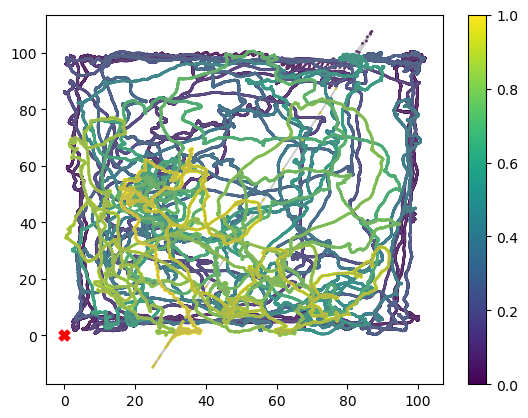

In [60]:
#i already took only square field in preprocessing
plot_trajectory(resampled_df['x'],resampled_df['y'])
#я вот еще не нахожу точного момента когда мышь переместили из квадратного открытого поля в круглое

In [61]:
def plot_trajectory_areas(x, y, center_mark=True, wall_percent=0.1):
    time_cmap = np.arange(0, len(x))
    plt.scatter(x, y, s=1, c=time_cmap)
    plt.plot(x, y, c='gray', alpha=0.4)
    if center_mark:
        plt.scatter(0, 0, marker='X', s=60, c='red')
    plt.colorbar()
    min_x, max_x = np.min(x), np.max(x)
    min_y, max_y = np.min(y), np.max(y)
    ylen = max_y - min_y 
    xlen = max_x - min_x
    xl = min_x + xlen * wall_percent
    xr = max_x - xlen * wall_percent
    yd =min_y + ylen * wall_percent
    yu = max_y - ylen * wall_percent
    plt.axvline(x = xl, color = 'cyan')
    plt.axvline(x = xr, color = 'cyan')
    plt.axhline(y = yd, color = 'cyan')
    plt.axhline(y = yu, color = 'cyan')
    plt.show()

In [66]:
def cut_jumps(df, xmax, xmin, ymax, ymin, show=True):
    """
    Simply drops samples with jumps onto the walls
    """
    dff = df[(df['x'] < xmax) & (df['x'] > xmin) & (df['y'] < ymax) & (df['y'] > ymin)]
    ind = range(0, len(dff))
    dff = dff.reindex(ind)
    if show:
        # plot_trajectory(dff['x'], dff['y'])
        print('not implemented')
    return dff

In [72]:
resampled_df = cut_jumps(resampled_df, 100, 0, 100, 0)

not implemented


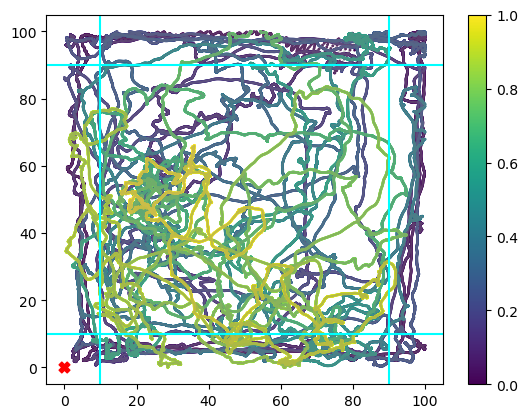

In [73]:
plot_trajectory_areas(resampled_df['x'],resampled_df['y'], wall_percent=0.1)

In [74]:
resampled_df_better = resampled_df.loc[(resampled_df['time']>=0) & (resampled_df['time']<=500)]

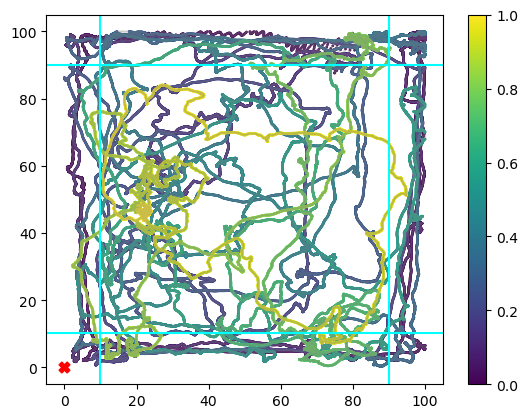

In [75]:
plot_trajectory_areas(resampled_df_better['x'],resampled_df_better['y'], wall_percent=0.1)

In [76]:
resampled_df = resampled_df.loc[(resampled_df['time']>=0) & (resampled_df['time']<=500)]

In [28]:
# df = resampled_df.loc[(resampled_df['time']>=600) & (resampled_df['time']<=1000)]
# plot_trajectory(df['x'],df['y'])

##### 2.2.2 add area demarkation (skip)

In [10]:
#resampled_df['x'].plot()

In [77]:
df_sq = resampled_df.copy()
AREA_SIZE = [-40, 40]
rescaled_x = rescale_coord(df_sq['x'].to_numpy(), AREA_SIZE[0], AREA_SIZE[1])
rescaled_y = rescale_coord(df_sq['y'].to_numpy(), AREA_SIZE[0], AREA_SIZE[1])
df_sq.loc[:, 'x'] = rescaled_x
df_sq.loc[:, 'y'] = rescaled_y
bord40 =  {'xmin': -40,'xmax': 40,'ymin': -40,'ymax': 40} 
df_sq = sort_walls_area_simple(df_sq, bord40, 0.1)

In [78]:
df_sq['near_wall'].value_counts()

0.0     83705
5.0     53385
50.0    11028
Name: near_wall, dtype: int64

In [79]:
df_sq.to_pickle('')

##### 2.2.3 plot signals when mouse crossed area boundary

###### 2.2.3.1 wall to corner

In [82]:
df_sq['area_change'] = df_sq['near_wall'].diff()
wall_to_corner_times = df_sq.loc[df_sq['area_change']==45]['time'].to_numpy()

In [84]:
##TODO ????
wall_to_corner_times = wall_to_corner_times[wall_to_corner_times>1]

In [85]:
#dict_sign

###### plots

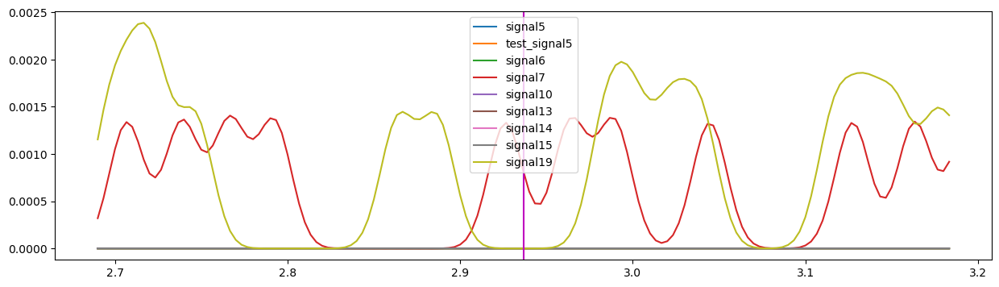

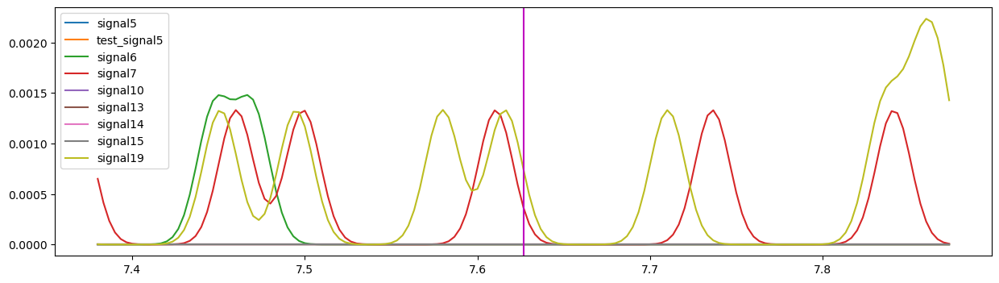

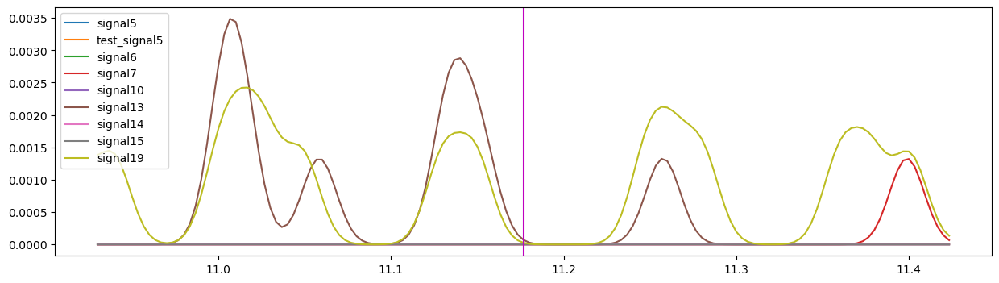

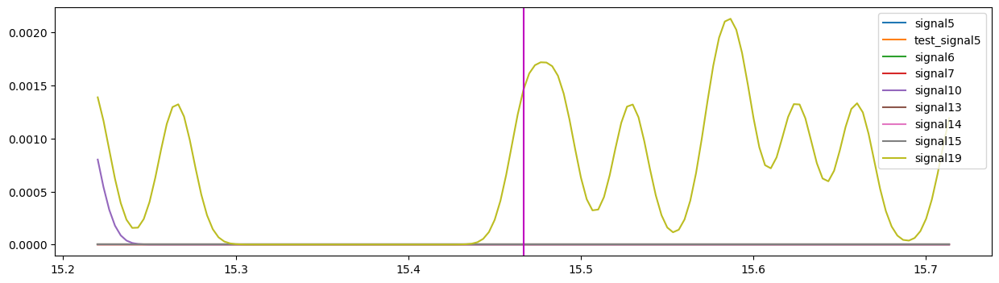

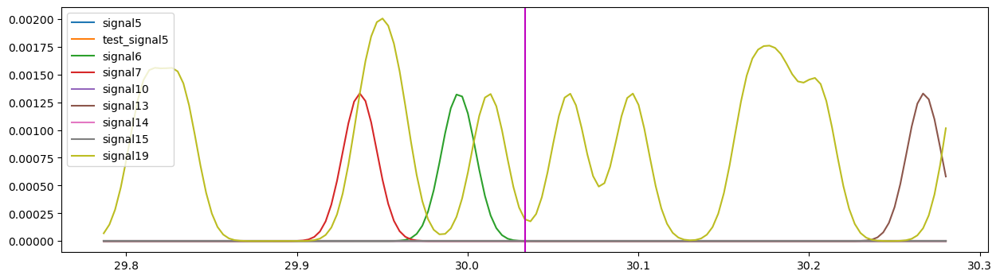

...

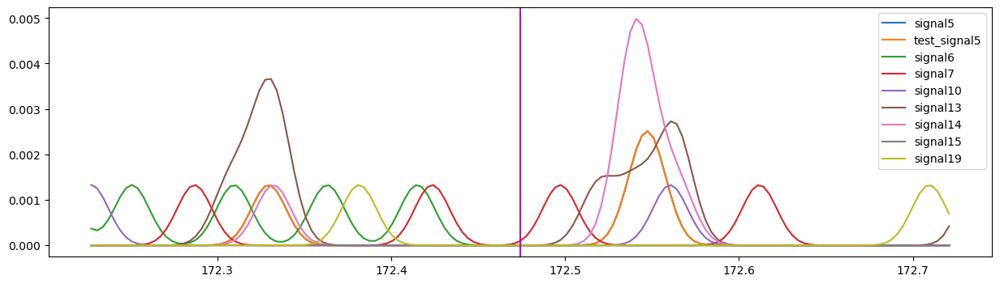

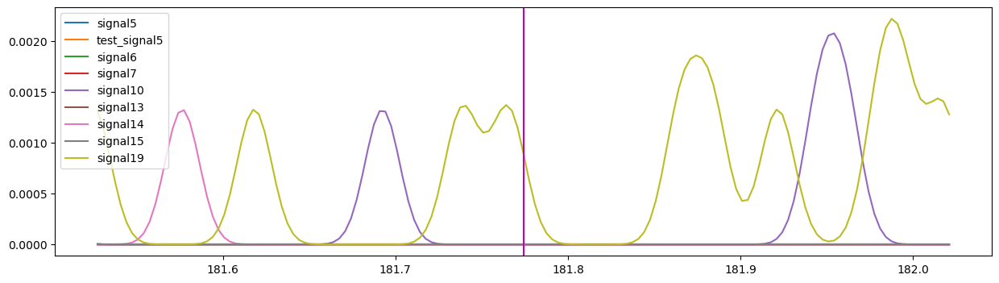

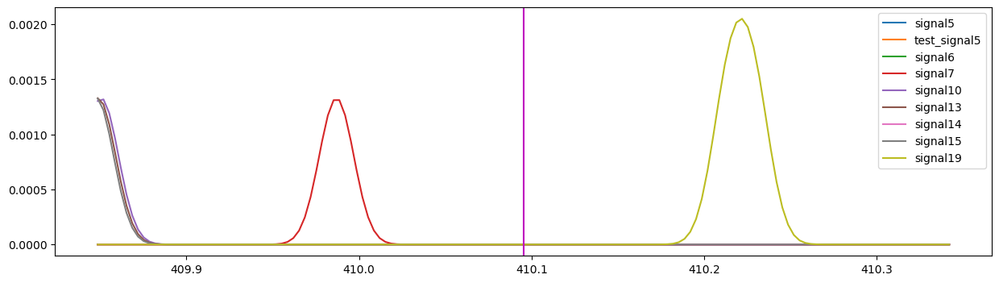

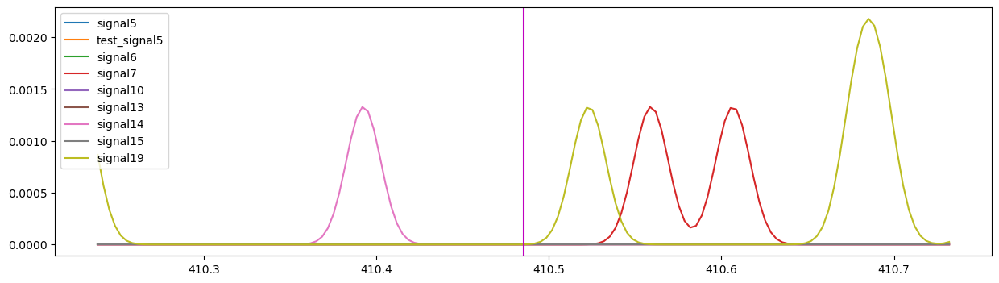

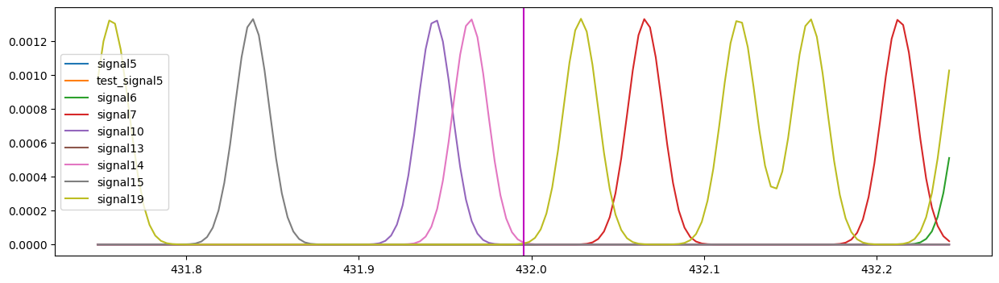

In [86]:
#output is not full, only first 50 plots
change_area_cut = {}
t_range_area_change = 0.5
for i in wall_to_corner_times:
    change_area_cut[i] = plotNs(df_sq, i, signals, t_range_area_change)

###### end of plots

In [23]:
#change_area_cut[i]

In [78]:
# for i, df in change_area_cut.items():
#     print(i, len(df))

In [87]:
change_area_cut

{2.936680650860242:          time          x          y       signal5  test_signal5       signal6  \
 807  2.690013 -27.892456  38.370311  6.070285e-10  6.070285e-10 -7.249629e-11   
 808  2.693346 -27.956787  38.331267 -6.044103e-10 -6.044103e-10  6.976889e-11   
 809  2.696680 -28.020032  38.291616  6.018205e-10  6.018205e-10 -6.714148e-11   
 810  2.700013 -28.079896  38.255576 -5.992586e-10 -5.992586e-10  6.460956e-11   
 811  2.703346 -28.134446  38.226931  5.967242e-10  5.967242e-10 -6.216889e-11   
 ..        ...        ...        ...           ...           ...           ...   
 951  3.170015 -35.082928  39.063961  3.898296e-10  3.898296e-10  5.084811e-10   
 952  3.173348 -35.121067  39.049934 -3.889414e-10 -3.889414e-10 -5.470577e-10   
 953  3.176682 -35.154400  39.047634  3.880579e-10  3.880579e-10  5.877007e-10   
 954  3.180015 -35.183065  39.056982 -3.871791e-10 -3.871791e-10 -6.276465e-10   
 955  3.183348 -35.207739  39.076680  3.863051e-10  3.863051e-10  6.590079e-10 

In [89]:
#TODO change 149

In [88]:
bad = []
for i, df in change_area_cut.items():
    print(i, len(df))
    if len(df) != 149:
        print('bad')
        bad.append(i)

for i in bad:
    del change_area_cut[i]

2.936680650860242 149
7.626702984299925 149
11.176719889142328 149
15.466740317811036 149
30.03347634988738 149
40.4568593183777 149
48.300230001095244 149
77.68036990652337 149
83.62039819237235 149
142.1040100190953 149
153.09406235267787 149
160.54409782903727 149
165.02745251167863 149
167.06412887680418 149
167.50413097205225 149
172.4741546388316 149
181.77419892475677 149
410.09528616802936 149
410.48528802518103 149
431.99539045424024 149


In [ ]:
# bad = []
# for i, df in change_area_cut.items():
#     print(i, len(df))
#     if i > 1050 - t_range_area_change/2 -0.01:
#         bad.append(i)

# for i in bad:
#     del change_area_cut[i]

# print(len(signals))
# print(len(change_area_cut))

# #t_range_area_change = 0.5
# time_area = np.linspace(0, t_range_area_change, l)
# v = np.median(time_area)

In [90]:
dict_sign = {}
for s in signals:
    s_list = []
    for i, df in change_area_cut.items():
        s_list.append(change_area_cut[i][s])
    dict_sign[s] = np.array(s_list)

In [91]:
print(len(signals))
print(len(change_area_cut))

9
20


In [92]:
#t_range_area_change = 0.5
l=149
time_area = np.linspace(0, t_range_area_change, l)
v = np.median(time_area)

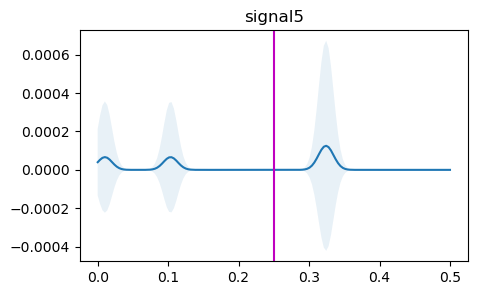

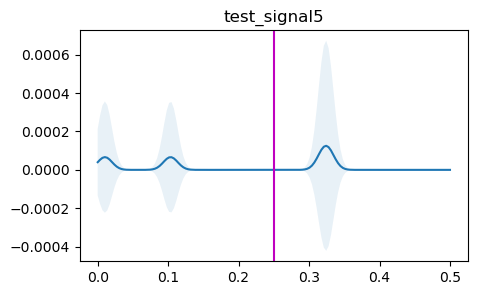

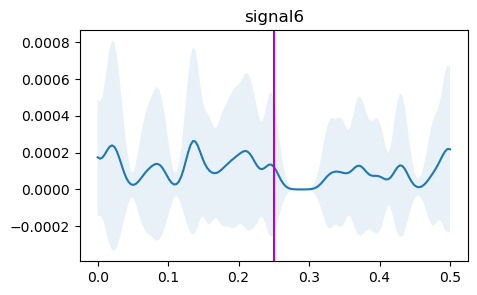

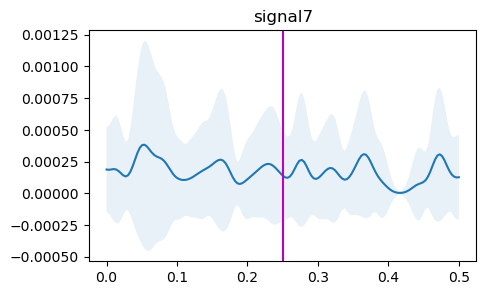

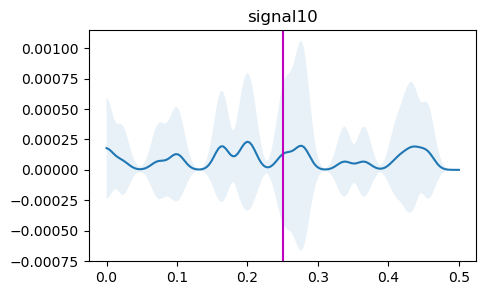

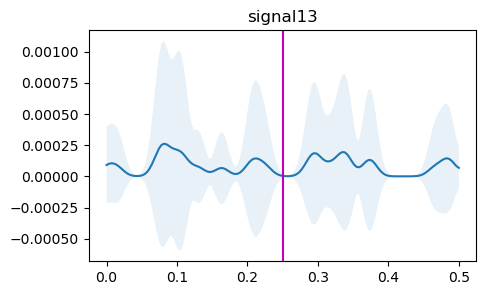

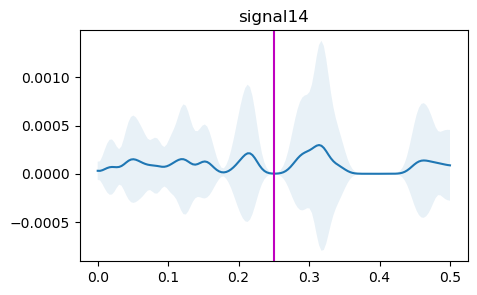

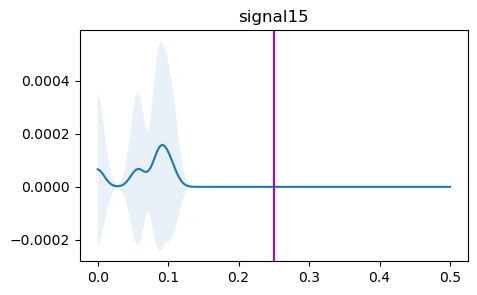

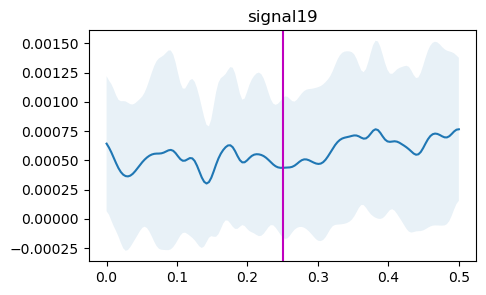

In [93]:
#max signal: 0.1
means = {}
stds = {}
for s in signals:
    plt.figure(figsize=(5,3))
    means[s] = np.mean(dict_sign[s], axis=0)
    stds[s] = np.std(dict_sign[s], axis=0)
    plt.plot(time_area, means[s])
    plt.fill_between(time_area,means[s]-stds[s],means[s]+stds[s],alpha=.1)
    plt.axvline(x=v, color='m')
    plt.title(s)
    plt.show()

###### 2.2.3.1.2 more areas - не запускала

In [ ]:
def sort_walls_area(tr, border_tr, wall_percent=0.1): 
    ylen = border_tr['ymax'] - border_tr['ymin'] 
    xlen = border_tr['xmax'] - border_tr['xmin'] 
    xl = border_tr['xmin'] + xlen * wall_percent
    xr = border_tr['xmax'] - xlen * wall_percent
    yd = border_tr['ymin'] + ylen * wall_percent
    yu = border_tr['ymax'] - ylen * wall_percent

    tr['near_wall'] = 0.
    for i in range(len(tr)):     
        if tr['x'].iloc[i] < xl:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 40
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 30
            else:
                tr['near_wall'].iloc[i] = 4
        elif tr['x'].iloc[i] > xr:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 10
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 20
            else:
                tr['near_wall'].iloc[i] = 2
        elif tr['y'].iloc[i] > yu:
            tr['near_wall'].iloc[i] = 1
        elif tr['y'].iloc[i] < yd:
            tr['near_wall'].iloc[i] = 3
    return tr

def plot_wall_sorted_samples(df, plot_title):
    all_areas = [40, 30, 20, 10, 4, 3, 2, 1, 0]
    for a in all_areas:
        x = df.loc[df['near_wall'] == a]['x']
        y = df.loc[df['near_wall'] == a]['y']
        plt.scatter(x, y, s=1.5, label=str(a))
    plt.gca().set_aspect('equal')
    plt.title(plot_title)
    plt.legend(loc='center')
    plt.show()

###### 2.2.3.2 wall to center

In [94]:
df_sq['area_change'] = df_sq['near_wall'].diff()
wall_to_corner_times = df_sq.loc[df_sq['area_change']==-5]['time'].to_numpy()

In [95]:
len(wall_to_corner_times)

56

In [227]:
# def plotNs(df, t, signals_list, deltat=0.5):
#     t1 = t-deltat/2
#     t2 = t+deltat/2
#     df = df.loc[(df['time']>=t1)&(df['time']<=t2)]
#     plt.figure(figsize=(15,4))
#     for s in signals_list:
#         plt.plot(df['time'], df[s], label=s)
#     plt.axvline(x=t, color='m')
#     plt.legend()
#     plt.show()
#     return df

# #def cutNs(df, t, signals_list, deltat=0.5):
    

In [96]:
wall_to_corner_times = wall_to_corner_times[wall_to_corner_times>1]

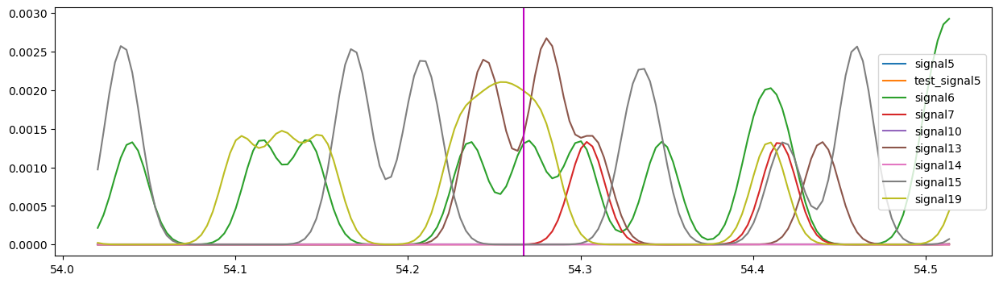

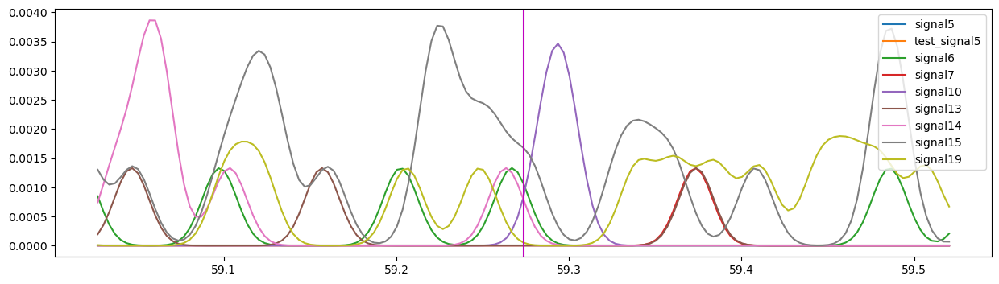

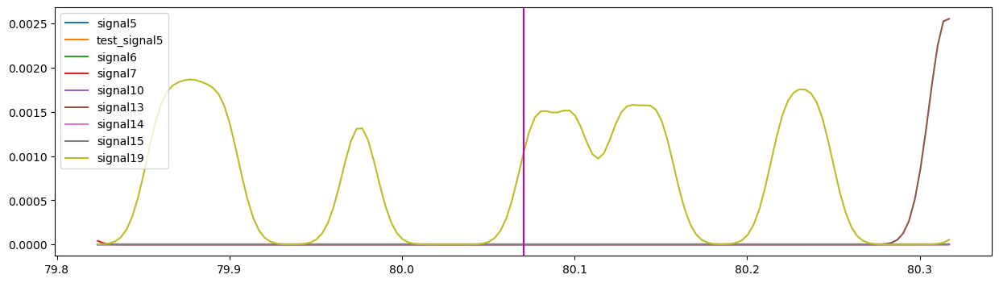

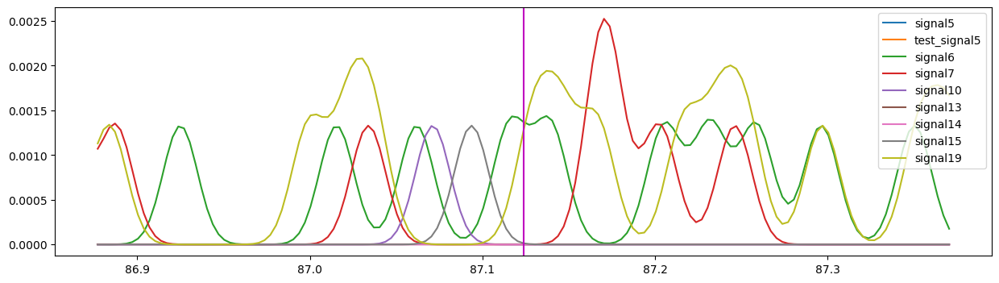

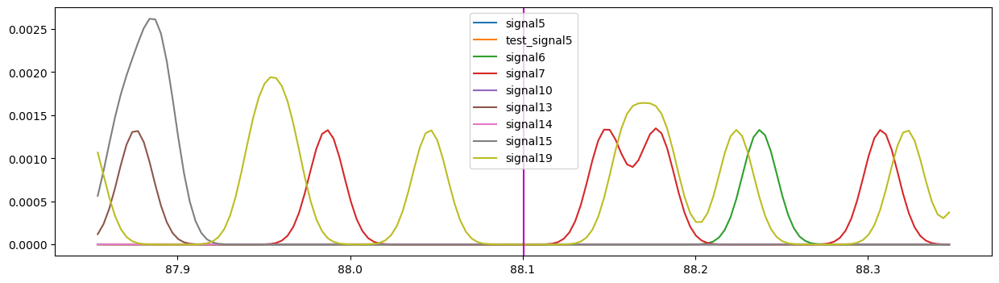

...

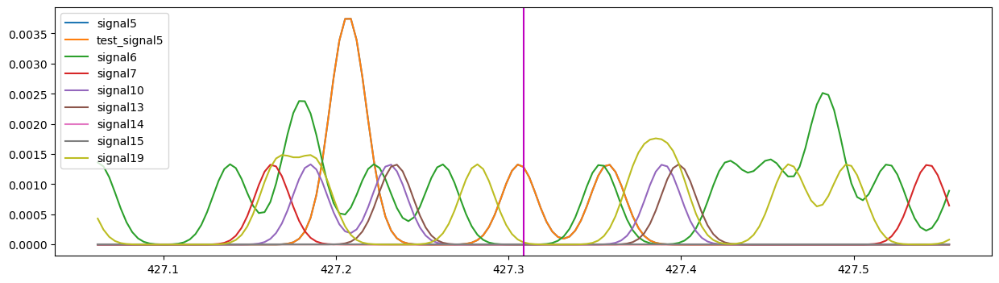

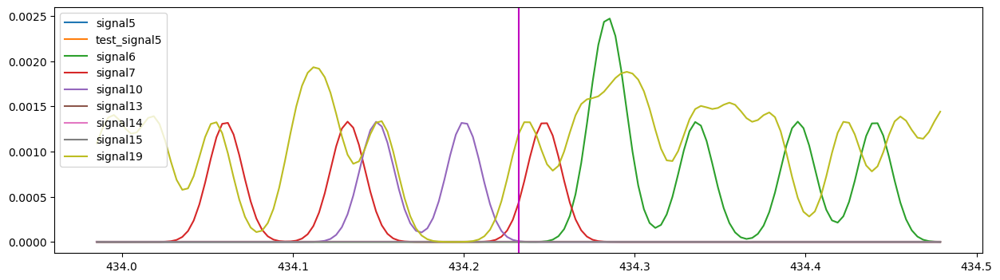

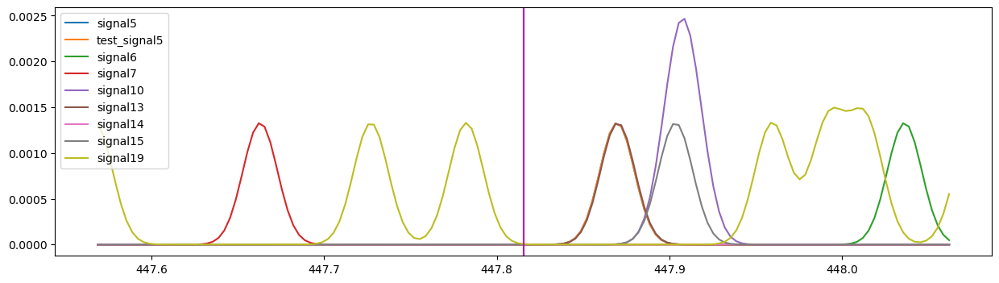

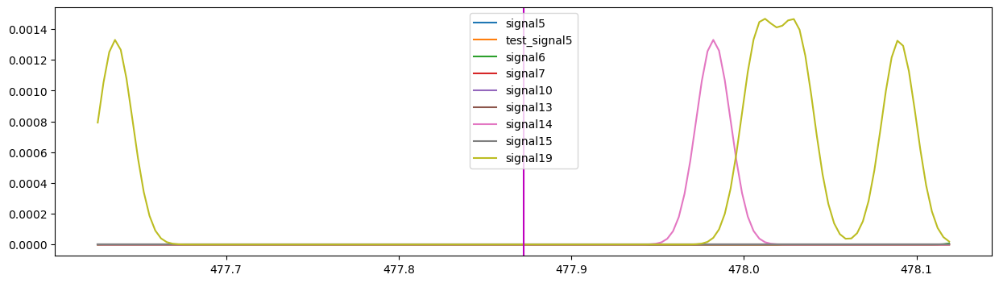

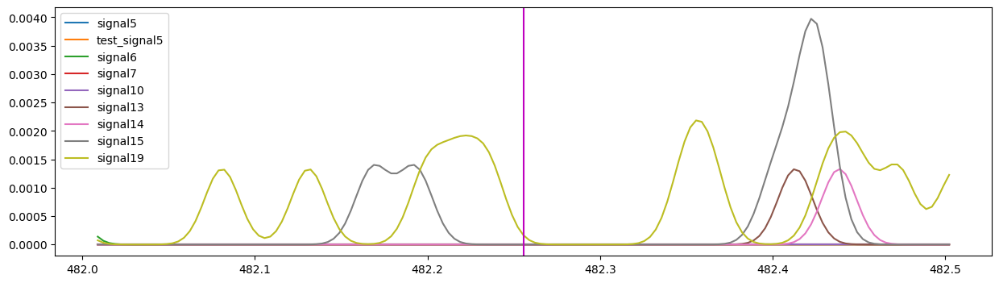

In [97]:
change_area_cut = {}
t_range_area_change = 0.5
for i in wall_to_corner_times:
    change_area_cut[i] = plotNs(df_sq, i, signals, t_range_area_change)

In [98]:
bad = []
for i, df in change_area_cut.items():
    print(i, len(df))
    if i > 1050 - t_range_area_change/2 -0.01:
        bad.append(i)

for i in bad:
    del change_area_cut[i]

print(len(signals))
print(len(change_area_cut))

#t_range_area_change = 0.5
time_area = np.linspace(0, t_range_area_change, l)
v = np.median(time_area)

54.26692508059562 149
59.27361558864566 149
80.07038128752994 149
87.1237482083248 149
88.10041952580727 149
94.3971161767437 149
102.52715489121377 149
108.98718565326502 149
109.630522050105 149
124.02059057424083 149
124.56392649488807 149
137.83065633645873 149
167.86746603555255 149
177.59084567069365 149
191.2275772741775 149
206.3976495126167 149
207.20765336977794 149
214.72435583026586 149
220.4577164653165 149
258.6278982280868 149
267.6946080695622 149
268.9646141172101 149
292.3880589907571 149
299.07809084805166 149
299.4014257210749 149
300.10142905442405 149
301.06476697508083 149
301.92810441954487 149
305.03811922913917 149
305.2281201339054 149
305.67478892756634 149
320.01152386439935 149
323.8882089914714 149
324.46154505497645 149
329.9649045947838 149
332.23491540435907 149
332.4715831980152 149
333.8515897694751 149
347.0249858332659 149
347.21498673803205 149
350.2850013571493 149
354.60835527788225 149
354.841689722332 149
364.39840189715187 149
384.50183096109

In [99]:
dict_sign = {}
for s in signals:
    s_list = []
    for i, df in change_area_cut.items():
        s_list.append(change_area_cut[i][s])
    dict_sign[s] = np.array(s_list)

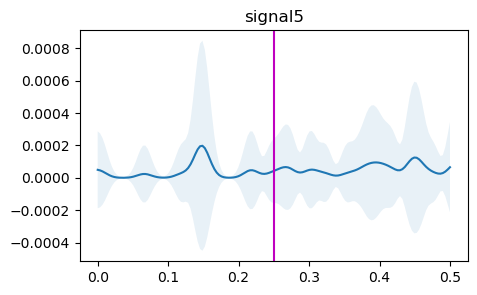

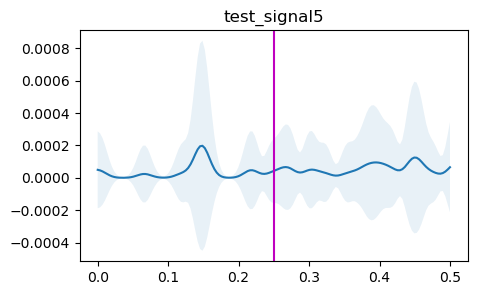

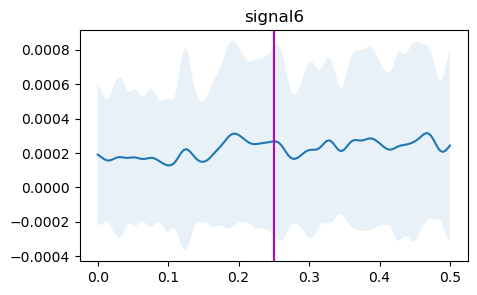

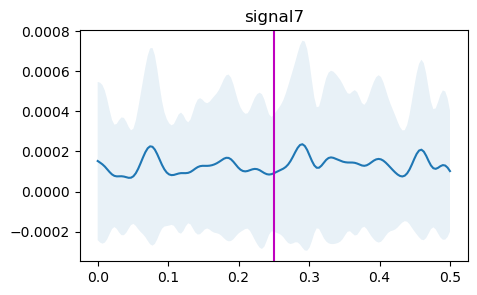

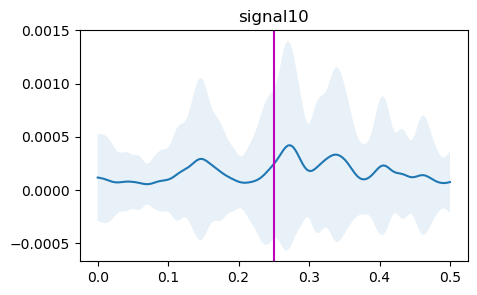

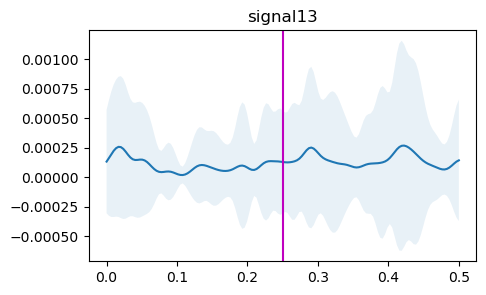

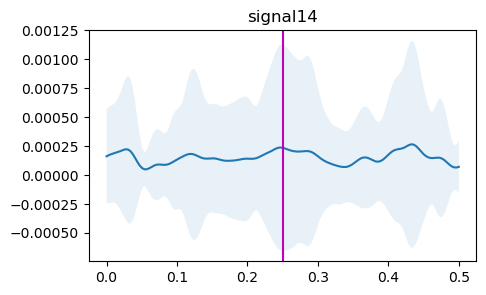

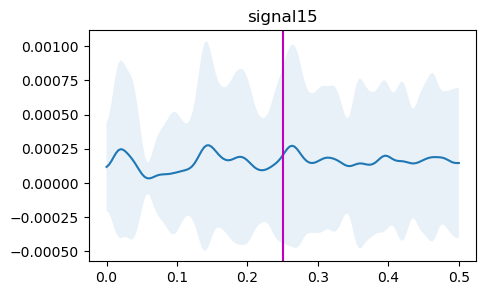

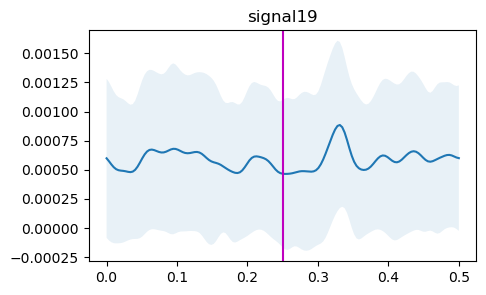

In [100]:
#t_range_area_change = 0.5
time_area = np.linspace(0, t_range_area_change, l)
v = np.median(time_area)
#max signal: 0.1
means = {}
stds = {}
for s in signals:
    plt.figure(figsize=(5,3))
    means[s] = np.mean(dict_sign[s], axis=0)
    stds[s] = np.std(dict_sign[s], axis=0)
    plt.plot(time_area, means[s])
    plt.fill_between(time_area,means[s]-stds[s],means[s]+stds[s],alpha=.1)
    plt.axvline(x=v, color='m')
    plt.title(s)
    plt.show()

##### 2.2.4 add pauses

###### 2.2.4.1 definition

пока возьмем чисто квадратное открытое поле пожалуй

TODO как будто что-то не так с семплинг рейтом, номера точек вроде как съезжают относительно времени хотя непонятно как...

In [237]:
# df_sq = resampled_df.loc[(resampled_df['time']>=0) & (resampled_df['time']<=400)]
# plot_trajectory(df_sq['x'],df_sq['y'])

In [243]:
#df_sq = df_sq.dropna()
# AREA_SIZE = [-40, 40]
# rescaled_x = rescale_coord(df_sq['x'].to_numpy(), AREA_SIZE[0], AREA_SIZE[1])
# rescaled_y = rescale_coord(df_sq['y'].to_numpy(), AREA_SIZE[0], AREA_SIZE[1])
# df_sq.loc[:, 'x'] = rescaled_x
# df_sq.loc[:, 'y'] = rescaled_y

In [101]:
def add_step_length(df):
    dx = df['x'].diff()
    dy = df['y'].diff()
    dx[0], dy[0] = 0., 0.,
    step_lens = (dx**2 + dy**2)**0.5
    df['step_length'] = step_lens
    return df

def movementOrNot(step_sum):
    if step_sum == -100:
        out = 'NotDefined'
    elif step_sum > max_step_of_stop:
        out = 'Move'
    elif step_sum <= max_step_of_stop:
        out = 'Stop'
    else:
        out = 'error'
    return out
    

In [102]:
df_sq = add_step_length(df_sq)

In [123]:
s_r

0.0033755007694704496

In [122]:
df_sq_c = df_sq.copy()
s_r = (df_sq_c['time'].max() - df_sq_c['time'].min())/ len(df_sq_c)
window_size = round(0.5/s_r)


df_sq_c = df_sq_c.iloc[1:]
#first row of df_sq_c does not have step length
s_r = (df_sq_c['time'].max() - df_sq_c['time'].min())/ len(df_sq_c)
window_size = round(0.5/s_r)
if len(df_sq_c) >= window_size:
    df_sq_c['step_sum_0.5'] = df_sq_c['step_length'].rolling(window_size).sum()
    df_sq_c['step_sum_0.5']=df_sq_c['step_sum_0.5'].fillna(-100)

In [124]:
max_step_of_stop = 2
func = np.vectorize(movementOrNot)
df_sq_c["movement"] = func(df_sq_c['step_sum_0.5'])
df_sq_c['movement'].value_counts()

Move          136313
Stop           11657
NotDefined       147
Name: movement, dtype: int64

Text(0.5, 1.0, 'Fraction of movement in 1 mouse')

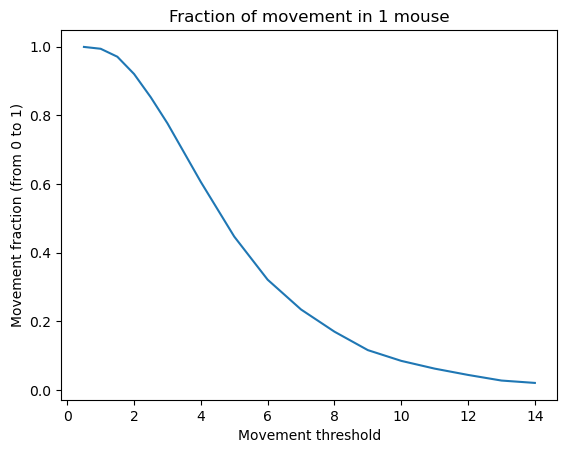

In [125]:
list_plot = [0.5,1,1.5,2,2.5] + list(range(3,15))
func = np.vectorize(movementOrNot)
mv_perc_mouse = []
for t in list_plot:
    max_step_of_stop = t
    func = np.vectorize(movementOrNot)
    df = df_sq_c.copy()
    df["movement"] = func(df['step_sum_0.5'])
    mv_perc_mouse.append(len(df.loc[df['movement']=='Move'])/len(df))
plt.plot(list_plot, mv_perc_mouse)
plt.xlabel("Movement threshold")
plt.ylabel("Movement fraction (from 0 to 1)")
plt.title('Fraction of movement in 1 mouse')

выходит порог 2.5 неплох

In [126]:
df = df_sq_c.copy()
mov = df["movement"].to_numpy()
np.array(np.unique(mov, return_counts=True)).T

array([['Move', 136313],
       ['NotDefined', 147],
       ['Stop', 11657]], dtype=object)

In [127]:
pause = np.zeros(len(mov))
for i in range(len(mov)):
    #if i == 'Move' or i == 'NotDefined':
    if mov[i] == 'Stop':
        x = mov[i-window_size:i]
        pause[i] = len(x[x=="Stop"]) / (len(x[x=="Stop"])+len(x[x=="Move"]))

df['perc_stop']=pause

In [128]:
np.sum(pause)

6863.216216216217

In [129]:
window_250ms = round(0.25/s_r)
start_pause = np.zeros(len(mov))
for j in range(len(pause)):
    if j >= window_size:
        if (pause[j]>= 0.99) and (pause[j-window_250ms]<=0.55) and (np.sum(start_pause[j-window_250ms:j])<1):
            start_pause[j] = 1
print(np.sum(start_pause))
df['start_pause']=start_pause

22.0


In [130]:
df_stops = df.loc[df['start_pause']==1]
stop_plus_ws = df_stops.index.to_numpy()

In [139]:
#df_stops = df.loc[df["perc_stop"]>0.99]

(array([1.36631e+05, 8.40000e+01, 1.65000e+02, 8.70000e+01, 1.64000e+02,
        8.20000e+01, 1.74000e+02, 8.10000e+01, 1.60000e+02, 8.00000e+01,
        1.81000e+02, 7.90000e+01, 1.57000e+02, 7.50000e+01, 1.49000e+02,
        7.30000e+01, 1.41000e+02, 6.90000e+01, 1.36000e+02, 9.70000e+01,
        1.34000e+02, 6.70000e+01, 1.33000e+02, 6.60000e+01, 6.60000e+01,
        1.31000e+02, 6.50000e+01, 1.30000e+02, 6.40000e+01, 1.27000e+02,
        6.30000e+01, 1.24000e+02, 6.20000e+01, 1.34000e+02, 6.10000e+01,
        1.33000e+02, 6.10000e+01, 1.20000e+02, 5.80000e+01, 1.15000e+02,
        5.60000e+01, 1.22000e+02, 5.30000e+01, 1.72000e+02, 5.30000e+01,
        1.06000e+02, 5.30000e+01, 1.04000e+02, 8.30000e+01, 5.10000e+01,
        1.02000e+02, 5.00000e+01, 9.70000e+01, 4.80000e+01, 9.20000e+01,
        4.30000e+01, 8.50000e+01, 4.10000e+01, 7.90000e+01, 3.80000e+01,
        1.53000e+02, 3.90000e+01, 8.00000e+01, 4.00000e+01, 8.20000e+01,
        3.90000e+01, 7.80000e+01, 3.90000e+01, 9.10

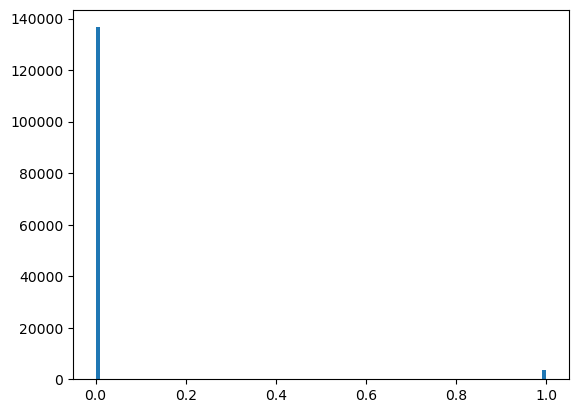

In [112]:
plt.hist(pause, bins=100)

In [113]:
df.tail()

,time,x,y,signal5,test_signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19,near_wall,area_change,step_length,step_sum_0.5,movement,perc_stop,start_pause
149995,499.985714,-20.940980,-2.001560,-1.460050e-10,-1.460050e-10,5.284526e-11,4.264293e-10,1.998904e-10,7.627253e-11,-4.382225e-08,-4.983091e-11,-2.904650e-09,0.0,0.0,0.006328,2.536782,Move,0.0,0.0
149996,499.989048,-20.936598,-2.003082,1.461698e-10,1.461698e-10,-5.222012e-11,-7.805397e-10,-1.981757e-10,-7.606897e-11,2.157045e-08,4.971423e-11,2.897497e-09,0.0,0.0,0.004639,2.521363,Move,0.0,0.0
149997,499.992381,-20.933598,-2.003752,-1.463353e-10,-1.463353e-10,5.161263e-11,1.064364e-09,1.964974e-10,7.586593e-11,-1.384347e-08,-4.959279e-11,-2.894383e-09,0.0,0.0,0.003073,2.503537,Move,0.0,0.0
149998,499.995714,-20.931813,-2.003703,1.465015e-10,1.465015e-10,-5.102384e-11,-1.296108e-09,-1.948545e-10,-7.566343e-11,1.004102e-08,4.946642e-11,2.895506e-09,0.0,0.0,0.001786,2.483781,Move,0.0,0.0
149999,499.999048,-20.930984,-2.003104,-1.466684e-10,-1.466684e-10,5.045485e-11,1.488264e-09,1.932461e-10,7.546145e-11,-7.804707e-09,-4.933494e-11,-2.901204e-09,0.0,0.0,0.001023,2.462817,Move,0.0,0.0


###### 2.2.6 pauses + neuro

In [114]:
2.5 * 150 / 300

1.25

In [154]:
print(window_size)
int(window_size * 2.5)

148


370

In [153]:
# def plot_stop_xy(df, g, window_size=window_size, signals=signals):
#     w1 = int(window_size * 0.5)
#     w2 = int(window_size * 1.5)
#     w3 = int(window_size * 2.5)
#     i1 = g - w3
#     df = df.iloc[i1:g]
#     plt.figure(figsize=(5,3))
#     # for s in signals:
#     #     plt.plot(df['time'], df[s], label=s)
#     x = rescale_coord(df['x'], 0, 0.1)
#     y = rescale_coord(df['y'], 0, 0.1)
#     plt.plot(df['time'], x, label='x')
#     plt.plot(df['time'], y, label='y')
#     plt.axvline(x=(g*s_r), color='m')
#     plt.axvline(x=(g-w1)*s_r, color='m')
#     plt.axvline(x=(g-w2)*s_r, color='m')
#     plt.axvline(x=(g-w3)*s_r, color='m')
#     plt.legend()
#     plt.show()
    

In [136]:
# def plot_stop(df, g, window_size=window_size, signals=signals):
#     w1 = int(window_size * 0.5)
#     w2 = int(window_size * 1.5)
#     w3 = int(window_size * 2.5)
#     i1 = g - w3
#     stop_start = g - w2
#     df = df.iloc[i1:g]
#     plt.figure(figsize=(9,4))
#     for s in signals:
#         plt.plot(df['time'], df[s], label=s)
#     x = rescale_coord(df['x'], -0.002, 0)
#     y = rescale_coord(df['y'], -0.002, 0)
#     plt.plot(df['time'], x, label='x')
#     plt.plot(df['time'], y, label='y')
#     plt.axvline(x=(g*s_r), color='darkviolet')
#     plt.axvline(x=(g-w1)*s_r, color='fuchsia', label='start of 99% low sum')
#     plt.axvline(x=(g-w2)*s_r, color='palevioletred', label='start of low sum')
#     plt.legend()
#     plt.show()
#     return df, (stop_start, g, )

In [149]:
df['time'].iloc[g]

142.45734503497636

In [155]:
def plot_stop(ddf, g, window_size=window_size, signals=signals):
    w1 = int(window_size * 0.5)
    w2 = int(window_size * 1.5)
    w3 = int(window_size * 2.5)
    i1 = g - w3
    stop_start = g - w2
    df = ddf.iloc[i1:g]
    plt.figure(figsize=(9,4))
    for s in signals:
        plt.plot(df['time'], df[s], label=s)
    x = rescale_coord(df['x'], -0.002, 0)
    y = rescale_coord(df['y'], -0.002, 0)
    plt.plot(df['time'], x, label='x')
    plt.plot(df['time'], y, label='y')
    plt.axvline(x=ddf['time'].iloc[g], color='darkviolet')
    plt.axvline(x=ddf['time'].iloc[g-w1], color='fuchsia', label='start of 99% low sum')
    plt.axvline(x=ddf['time'].iloc[g-w2], color='palevioletred', label='start of low sum')
    plt.legend()
    plt.show()
    return df, (stop_start, g, )

In [152]:
# for i in range(len(stop_plus_ws)):
#     plot_stop_xy(df_sq, stop_plus_ws[i], window_size, signals)
# #conclusion: mouse stopped 1.5 ws ago

In [117]:
#stop_cut[94864]

,time,x,y,signal2,signal12,signal14,signal16,signal17,signal18,signal20,signal21,signal23,signal25,signal28,signal30,near_wall,area_change,step_length
94489,314.964333,37.563522,2.787048,1.735229e-03,0.043950,0.023156,0.020951,0.020949,0.021581,0.024329,0.021918,0.022659,0.021695,0.056544,0.021034,5.0,0.0,0.008694
94490,314.967667,37.568553,2.794837,3.515354e-03,0.049267,0.017451,0.022387,0.021064,0.020955,0.024366,0.022641,0.022590,0.021316,0.012853,0.021626,5.0,0.0,0.009273
94491,314.971000,37.574652,2.802800,6.432413e-03,0.007928,0.022125,0.020991,0.020949,0.021578,0.024312,0.021932,0.022660,0.021695,0.026652,0.021031,5.0,0.0,0.010030
94492,314.974333,37.581730,2.811066,1.064548e-02,0.030002,0.018178,0.022356,0.021064,0.020958,0.024382,0.022628,0.022589,0.021317,0.017773,0.021629,5.0,0.0,0.010882
94493,314.977667,37.589647,2.819745,1.598428e-02,0.013794,0.021584,0.021015,0.020949,0.021575,0.024297,0.021945,0.022661,0.021695,0.024528,0.021028,5.0,0.0,0.011747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94859,316.197670,37.308863,2.277173,9.267794e-07,0.062063,0.020385,0.023791,0.020957,0.021100,0.024244,0.022083,0.022495,0.021217,0.021584,0.022073,5.0,0.0,0.001354
94860,316.201004,37.309168,2.277911,1.825841e-06,0.012905,0.019612,0.019975,0.021056,0.021416,0.024443,0.022484,0.022754,0.021818,0.021443,0.020539,5.0,0.0,0.000799
94861,316.204337,37.308678,2.278547,1.026071e-05,0.026924,0.020384,0.023203,0.020957,0.021134,0.024244,0.022082,0.022496,0.021167,0.021581,0.022173,5.0,0.0,0.000803
94862,316.207671,37.307430,2.279077,3.621516e-05,0.061700,0.019612,0.020187,0.021056,0.021386,0.024443,0.022485,0.022754,0.021873,0.021446,0.020424,5.0,0.0,0.001356


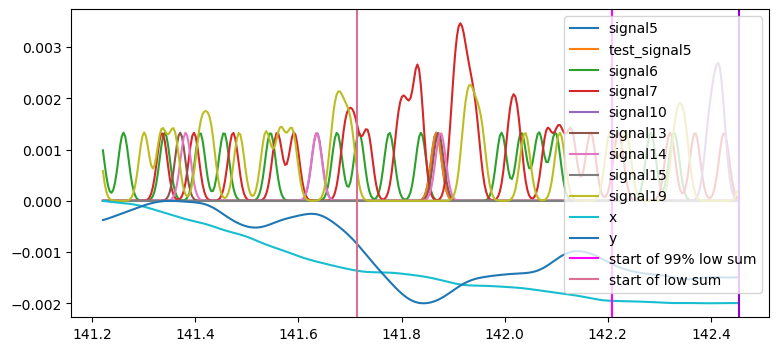

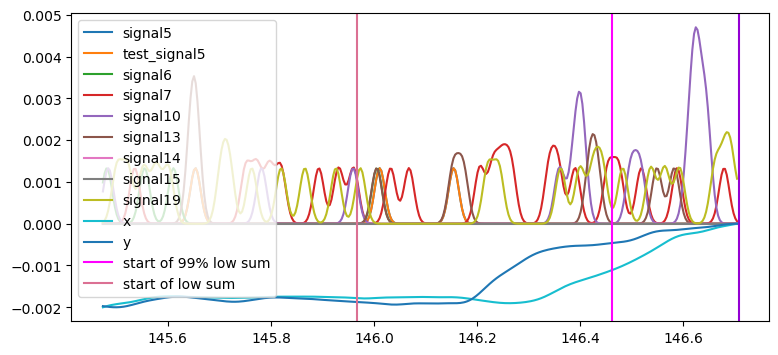

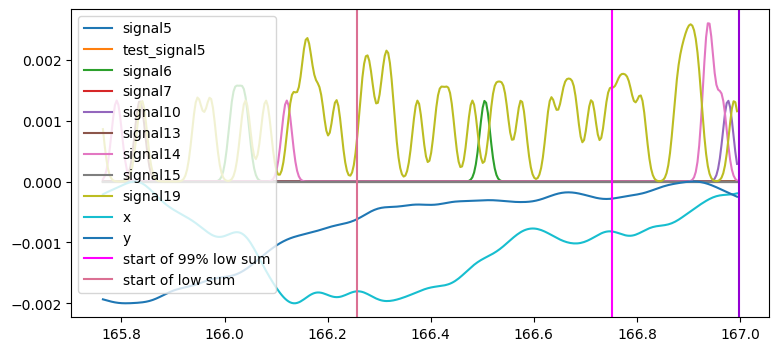

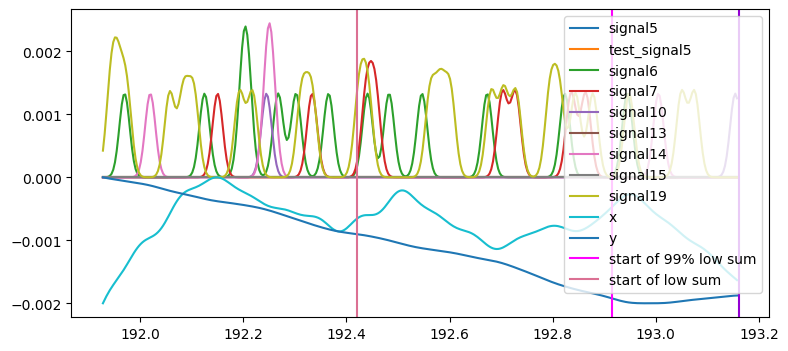

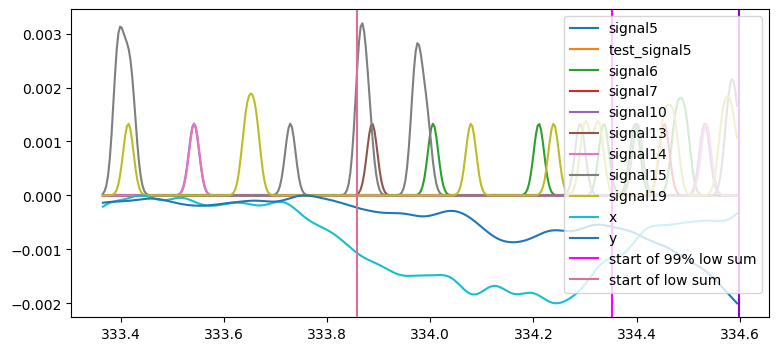

...

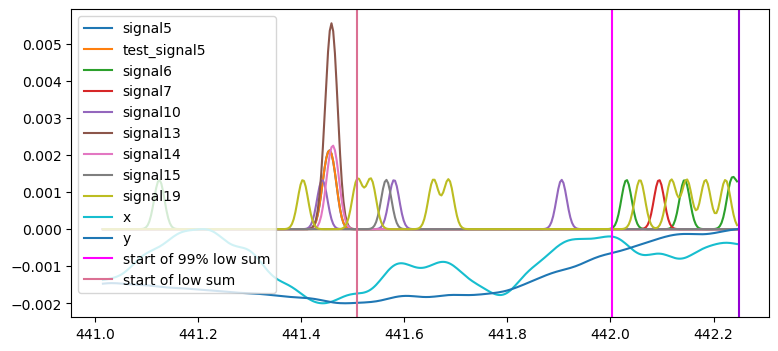

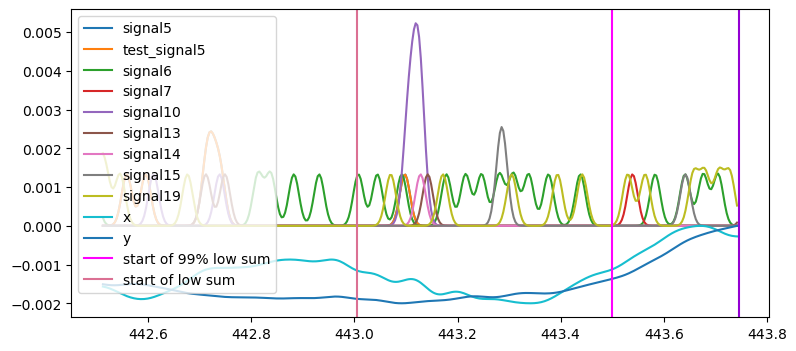

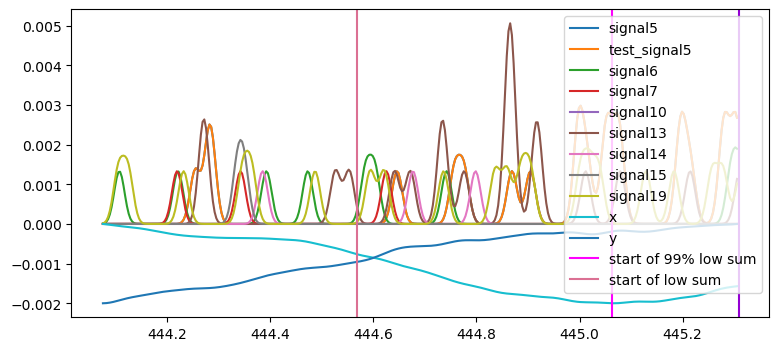

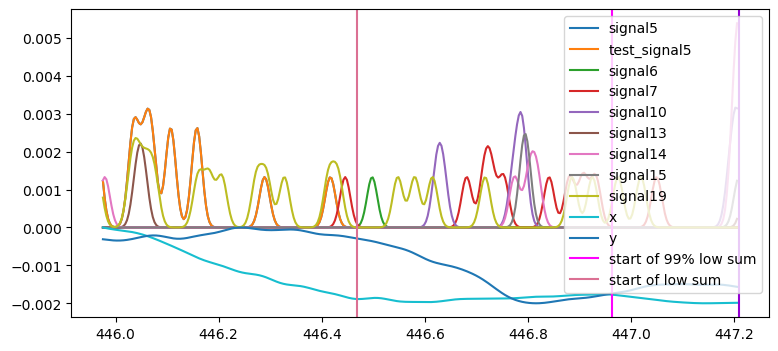

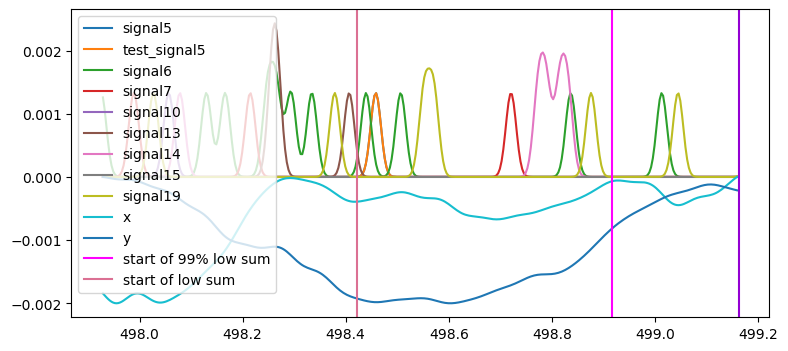

IndexError: single positional indexer is out-of-bounds

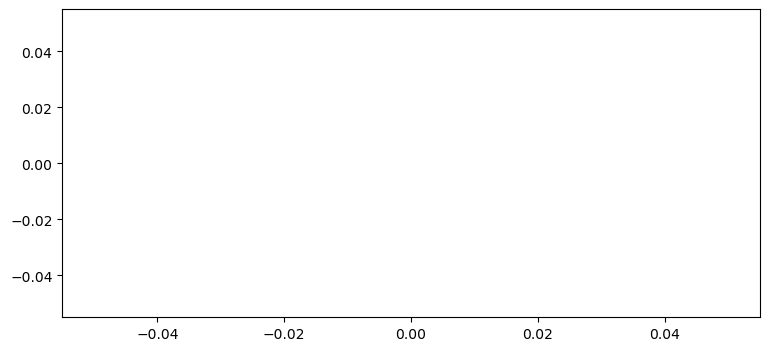

In [156]:
stop_cut = {}
v = []
for i in range(len(stop_plus_ws)):
    stop_cut[stop_plus_ws[i]], vv = plot_stop(df_sq, stop_plus_ws[i], window_size, signals)
    v.append(vv)
#conclusion: mouse stopped 1.5 ws ago

In [312]:
#stop_plus_ws

In [288]:
#stop_times = stop_plus_ws - (2 * window_size)

In [158]:
#stop_cut

In [159]:
bad2 = []
#TODO change 370
good_len2 = 370
for i, df in stop_cut.items():
    print(i, len(df))
    if len(df) != good_len2:
        bad2.append(i)

41650 370
42926 370
48819 370
56137 370
98497 370
99176 370
102417 370
109802 370
112726 370
113375 370
114971 370
120510 370
121298 370
121819 370
122914 370
127710 370
130792 370
131241 370
131710 370
132280 370
147866 370


In [160]:
for i in bad2:
    del stop_cut[i]

print(len(signals))
print(len(stop_cut))

# #t_range_area_change = 0.5
# time_area = np.linspace(0, t_range_area_change, l)
# v = np.median(time_area)

9
21


In [161]:
1.25 * 300

375.0

In [162]:
dict_sign_paus = {}
for s in signals:
    s_list = []
    for i, df in stop_cut.items():
        s_list.append(stop_cut[i][s])
    dict_sign_paus[s] = np.array(s_list)

In [163]:
dict_sign_paus['signal7'].shape

(21, 370)

In [ ]:
# #t_range_area_change = 0.5
# time_area = np.linspace(0, t_range_area_change, l)
# v = np.median(time_area)

In [164]:
dict_sign_paus['signal15'].shape

(21, 370)

In [165]:
time_area2 = np.linspace(0, 370/300, 370)
v2 = 1.25 - 0.75 #время в секундах с начала семпла, когда ориентировочно произошла остановка

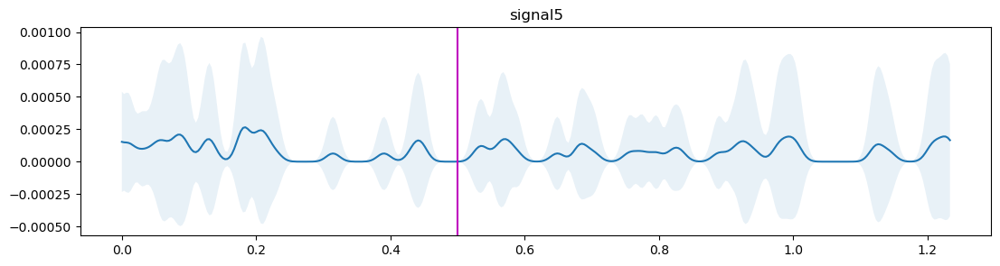

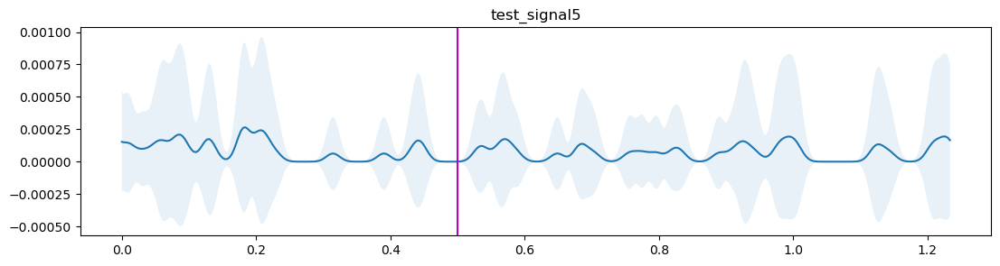

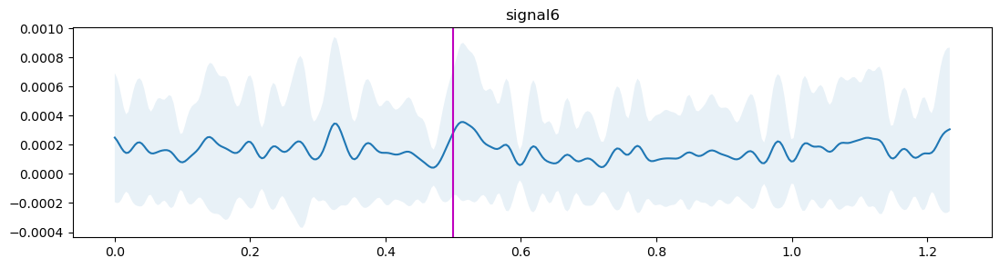

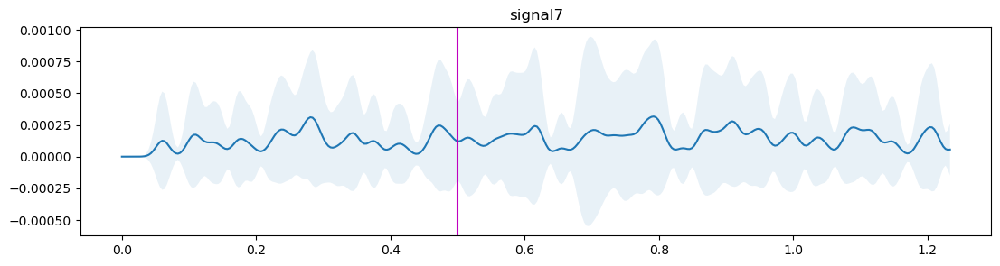

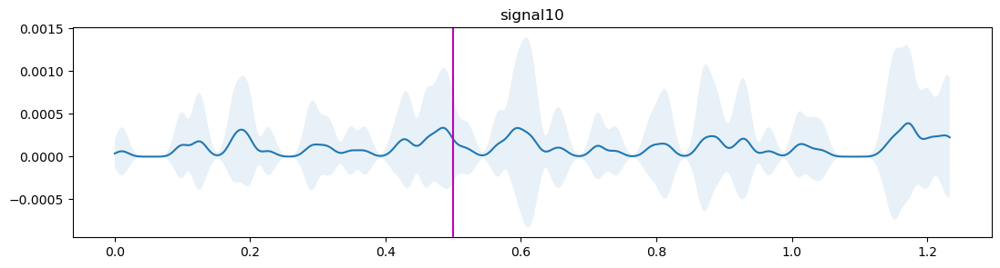

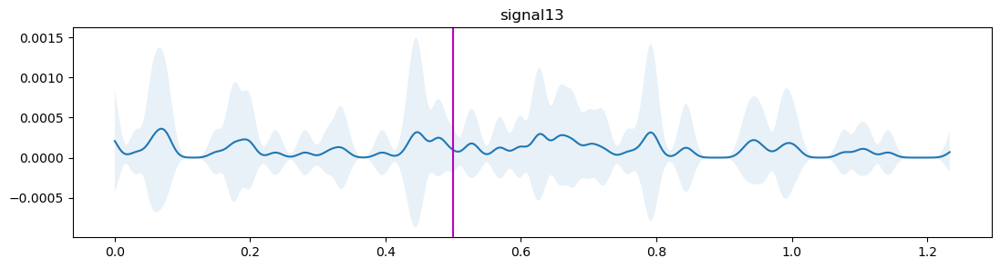

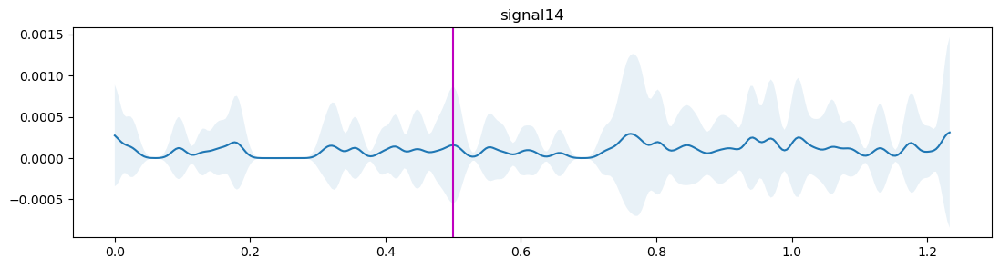

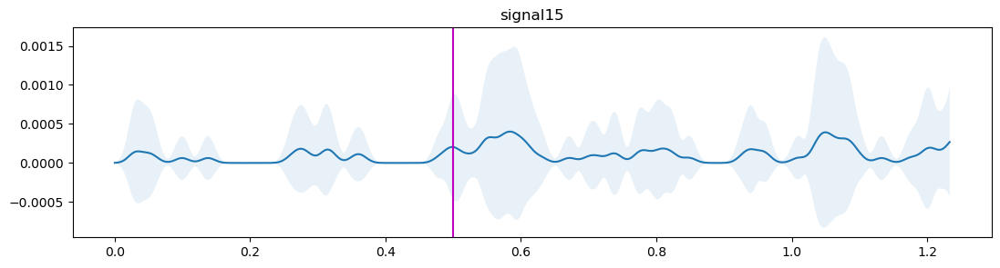

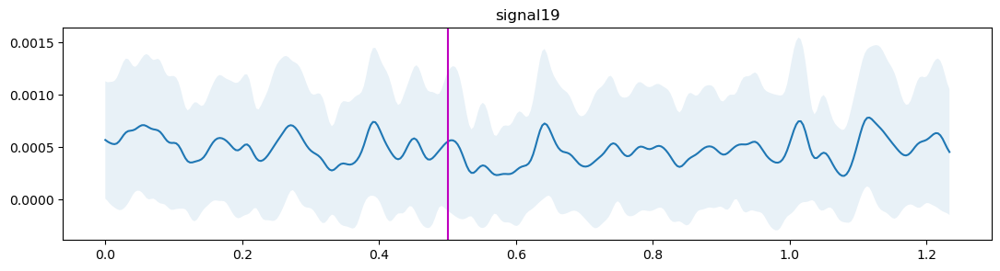

In [166]:
#max signal: 0.1
means2 = {}
stds2 = {}
for s in signals:
    plt.figure(figsize=(13,3))
    means2[s] = np.mean(dict_sign_paus[s], axis=0)
    stds2[s] = np.std(dict_sign_paus[s], axis=0)
    plt.plot(time_area2, means2[s])
    plt.fill_between(time_area2,means2[s]-stds2[s],means2[s]+stds2[s],alpha=.1)
    plt.axvline(x=v2, color='m')
    plt.title(s)
    plt.show()

###### 2.2.7 save big samples for Kate

In [267]:
int(150 * 1.5)

225

In [272]:
1 / s_r

300.00000000302344

In [278]:
def big_plot_stop(df, g, signals=signals):
    w2 = int(150 * 1.5)
    stop_start = g - w2
    i1 = stop_start - 10*300
    i2 = stop_start + 10*300
    df = df.iloc[i1:i2+1]
    plt.figure(figsize=(9,4))
    for s in signals:
        plt.plot(df['time'], df[s], label=s)
    x = rescale_coord(df['x'], -0.05, 0)
    y = rescale_coord(df['y'], -0.05, 0)
    plt.plot(df['time'], x, label='x')
    plt.plot(df['time'], y, label='y')
    plt.axvline(x=stop_start / 300, color='darkviolet')
    # plt.axvline(x=(g-w1)*s_r, color='fuchsia', label='start of 99% low sum')
    # plt.axvline(x=(g-w2)*s_r, color='palevioletred', label='start of low sum')
    plt.legend()
    plt.show()
    return df, (stop_start, g, )

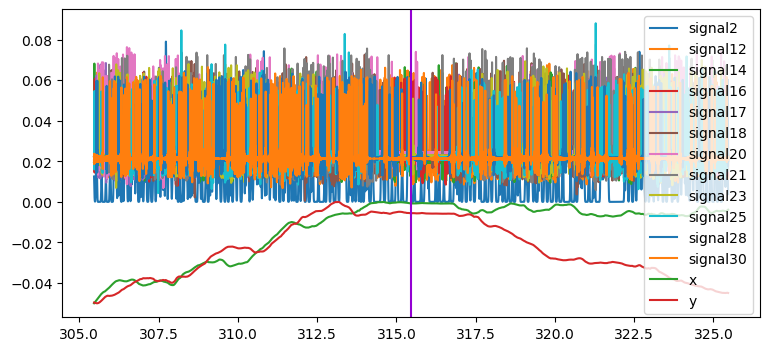

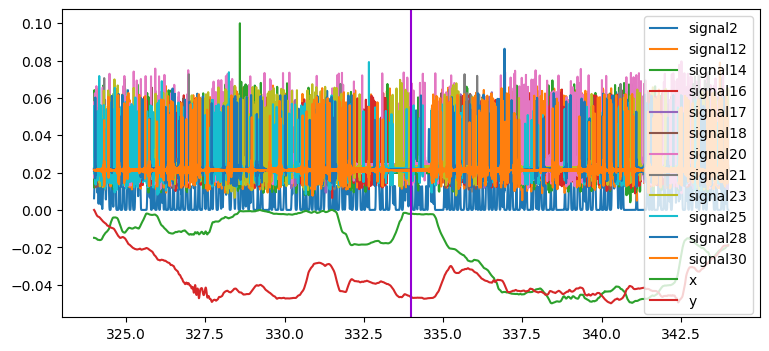

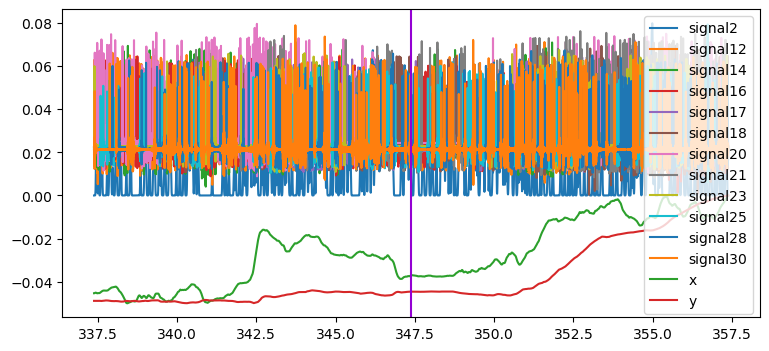

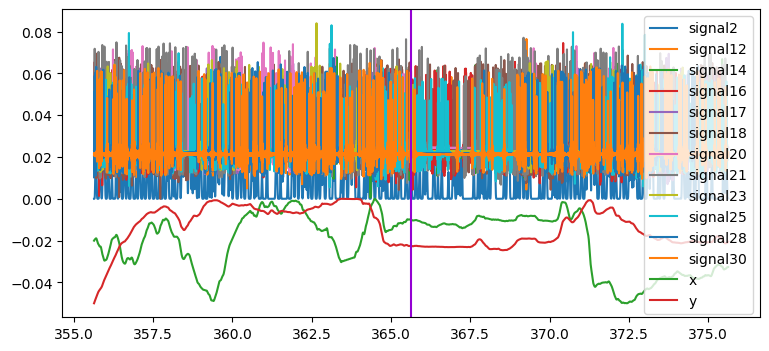

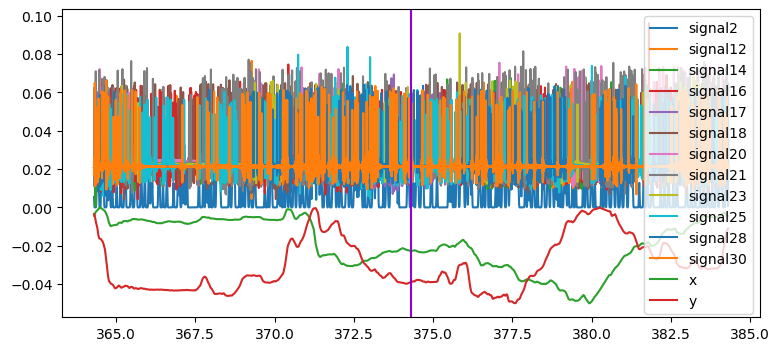

...

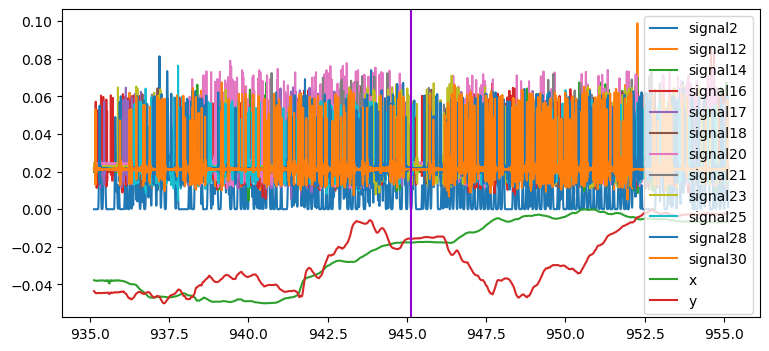

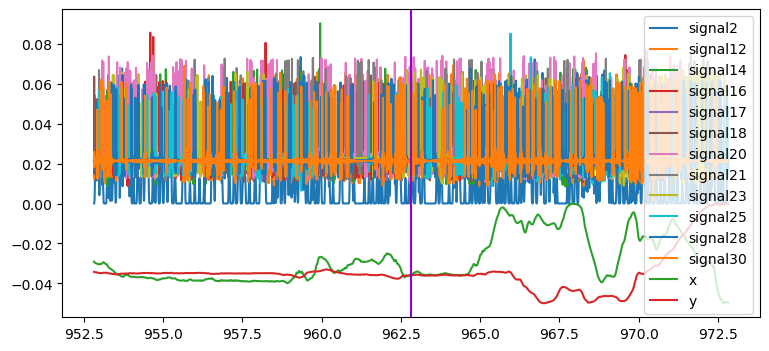

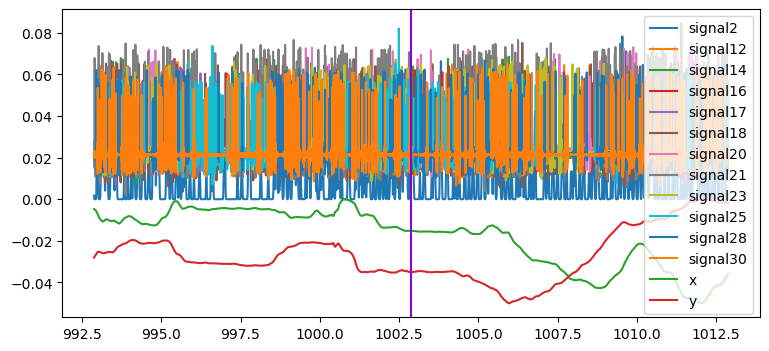

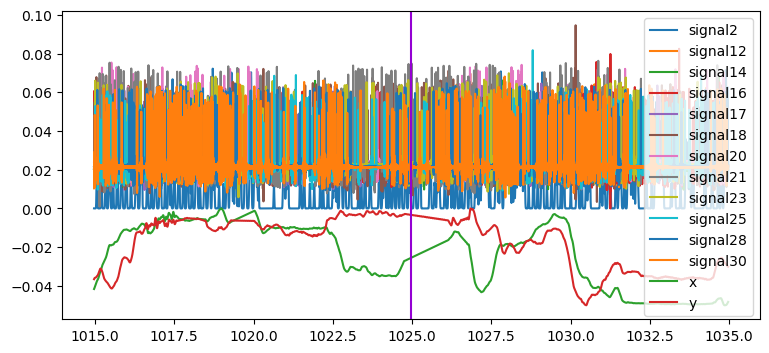

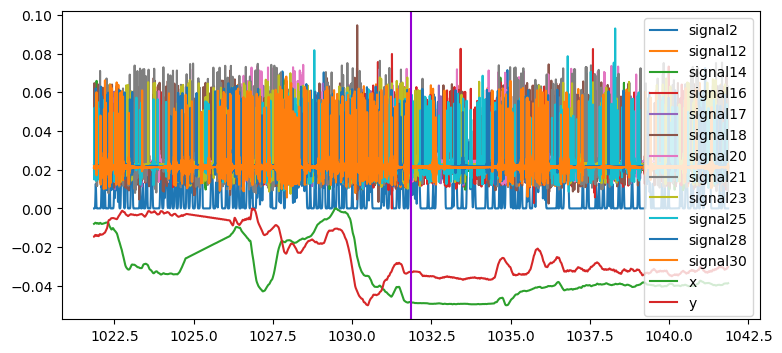

In [279]:
big_stop_cut = {}
big_v = []
for i in range(len(stop_plus_ws)):
    big_stop_cut[stop_plus_ws[i]], vv = big_plot_stop(df_sq, stop_plus_ws[i], signals)
    big_v.append(vv)
#conclusion: mouse stopped 1.5 ws ago

In [291]:
big_stop_cut[309782]

,time,x,y,signal2,signal12,signal14,signal16,signal17,signal18,signal20,signal21,signal23,signal25,signal28,signal30,near_wall,area_change,step_length
306557,1021.859911,37.202557,35.277465,0.000001,0.021127,0.019759,0.021505,0.020952,0.021052,0.024346,0.021617,0.022652,0.016350,0.021933,0.021859,50.0,0.0,0.004486
306558,1021.863244,37.206837,35.277439,0.000001,0.020800,0.020250,0.021856,0.021062,0.021481,0.024340,0.022969,0.022597,0.043396,0.021099,0.020793,50.0,0.0,0.004281
306559,1021.866577,37.213333,35.281587,0.000001,0.021128,0.019733,0.021504,0.020950,0.021052,0.024347,0.021575,0.022653,0.043683,0.021920,0.021873,50.0,0.0,0.007707
306560,1021.869911,37.221934,35.289838,0.000001,0.020799,0.020279,0.021857,0.021063,0.064708,0.024339,0.023014,0.022596,0.014905,0.021112,0.020777,50.0,0.0,0.011919
306561,1021.873244,37.232350,35.301791,0.000002,0.021129,0.019701,0.021502,0.020949,0.021084,0.024347,0.021526,0.022655,0.023175,0.021907,0.021892,50.0,0.0,0.015854
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312553,1041.846641,31.425877,32.808322,0.000001,0.017162,0.019997,0.016204,0.020887,0.016942,0.024215,0.031166,0.023417,0.020726,0.021282,0.020686,5.0,0.0,0.006217
312554,1041.849974,31.431011,32.808803,0.000001,0.026100,0.019999,0.024087,0.021126,0.023689,0.024472,0.008840,0.021842,0.022234,0.021730,0.022181,5.0,0.0,0.005157
312555,1041.853307,31.436710,32.806042,0.000001,0.012850,0.019998,0.020531,0.020886,0.019719,0.024214,0.062988,0.023399,0.020815,0.021308,0.020158,5.0,0.0,0.006333
312556,1041.856641,31.442759,32.801010,0.000001,0.041527,0.019999,0.022184,0.021127,0.022321,0.024474,0.045126,0.021859,0.022168,0.021706,0.023054,5.0,0.0,0.007868


In [298]:
309782 - 1.5 * 150

309557.0

In [294]:
312557 - 3000

309557

In [299]:
1.5 * 150

225.0

In [307]:
good_index_big_stop_cut[94639.0].loc[91639 + 3000]

time           315.464335
x               37.302404
y                2.426497
signal2          0.009199
signal12         0.018965
signal14         0.020489
signal16         0.020883
signal17         0.020953
signal18         0.021488
signal20         0.023980
signal21         0.022113
signal23         0.023306
signal25         0.021338
signal28         0.021277
signal30         0.021617
near_wall        5.000000
area_change      0.000000
step_length      0.003533
Name: 94639, dtype: float64

In [310]:
import pickle
with open('pauses_big_samples.pkl', 'wb') as fp:
    pickle.dump(good_index_big_stop_cut, fp)
    print('dictionary saved successfully to file')

dictionary saved successfully to file


In [311]:
with open('pauses_big_samples.pkl', 'rb') as fp:
    person = pickle.load(fp)
    print('Person dictionary')
    print(person)

Person dictionary
{94639.0:              time          x          y   signal2  signal12  signal14  \
91639  305.464303  -1.303644 -35.864617  0.012523  0.020204  0.019734   
91640  305.467636  -1.256299 -35.873175  0.010985  0.021685  0.019844   
91641  305.470970  -1.209148 -35.882904  0.008629  0.020278  0.021299   
91642  305.474303  -1.161925 -35.893915  0.006066  0.021619  0.068213   
91643  305.477636  -1.114400 -35.906214  0.003815  0.020336  0.017318   
...           ...        ...        ...       ...       ...       ...   
97635  325.451033  34.698218 -31.697594  0.014975  0.011938  0.019977   
97636  325.454367  34.732812 -31.709984  0.012145  0.047744  0.020015   
97637  325.457700  34.768000 -31.723741  0.009122  0.049927  0.019985   
97638  325.461033  34.803917 -31.738188  0.006253  0.011429  0.020008   
97639  325.464367  34.840664 -31.752628  0.003879  0.026718  0.019992   

       signal16  signal17  signal18  signal20  signal21  signal23  signal25  \
91639  0.030069 

In [309]:
good_index_big_stop_cut.to_pickle('pauses_big_samples.pkl')

AttributeError: 'dict' object has no attribute 'to_pickle'

In [300]:
good_index_big_stop_cut = {}
for i, df in big_stop_cut.items():
    good_index_big_stop_cut[i - 1.5 * 150] = df

In [308]:
#big_stop_cut[94864].iloc[3010]

In [ ]:
good_index_big_stop_cut

In [312]:
#stop_plus_ws

In [288]:
#stop_times = stop_plus_ws - (2 * window_size)

##### 2.2.5 psd

###### 2.2.5.1 psd in different areas

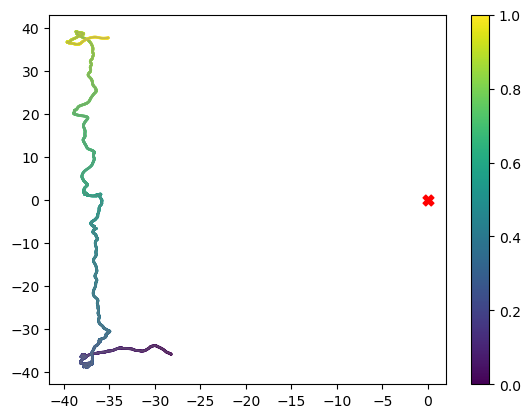

5.0     1588
50.0    1412
Name: near_wall, dtype: int64

In [167]:
some_df = df_sq.loc[(df_sq['time']>40) & (df_sq['time']<50)]
plot_trajectory(some_df['x'],some_df['y'])
some_df['near_wall'].value_counts()

In [35]:
# psds = {}
# for s in signals:
#     lil_dict = {}
#     for a in [5, 50, 0]:
#         psd_values, psd_freqs = plt.psd(df_sq.loc[df_sq['near_wall']==a][s], Fs=300, label=s+', area '+ str(a))
#         lil_dict[a] = [psd_freqs, psd_values]
#     psds[s] = lil_dict
#     plt.legend(loc='right')
#     plt.show()

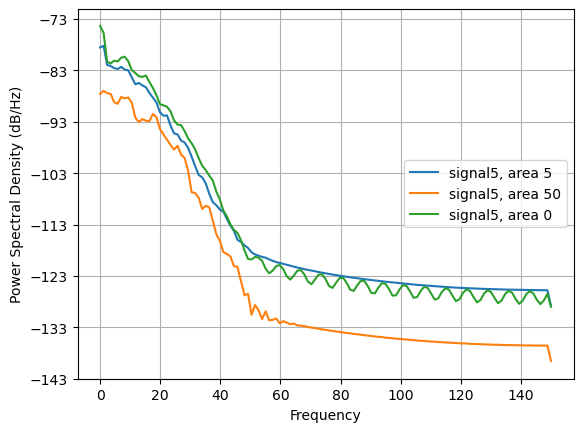

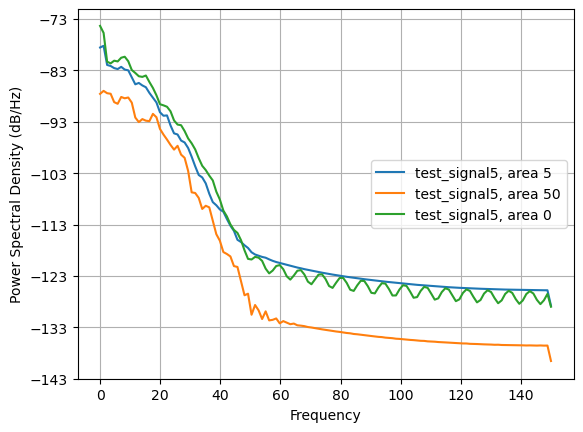

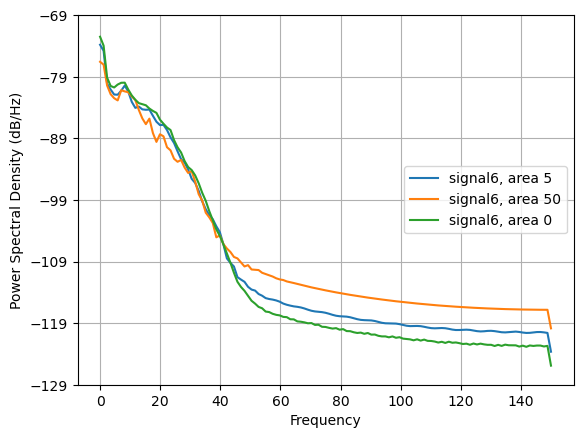

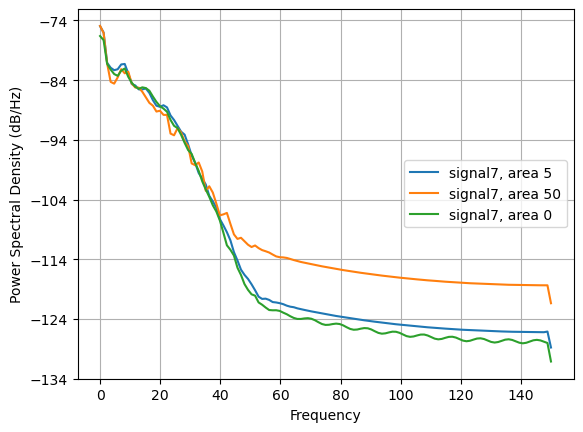

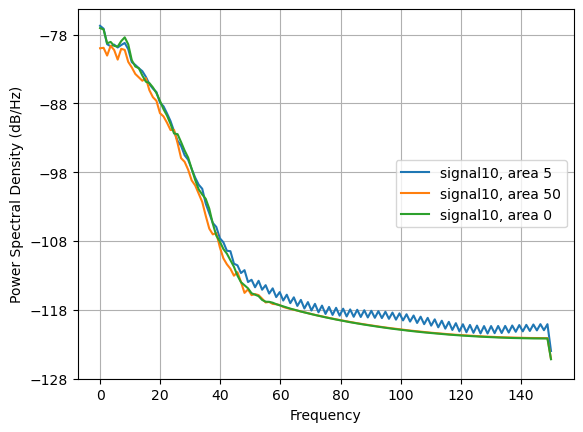

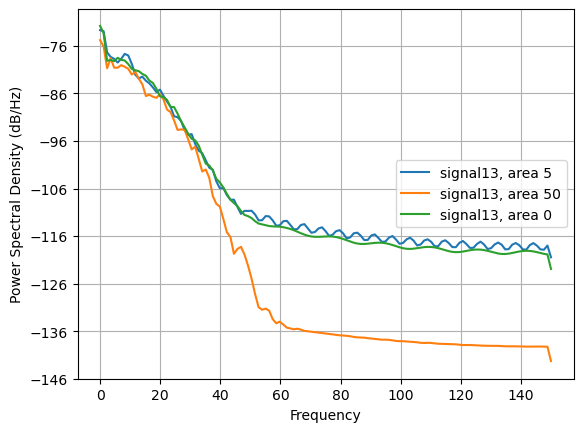

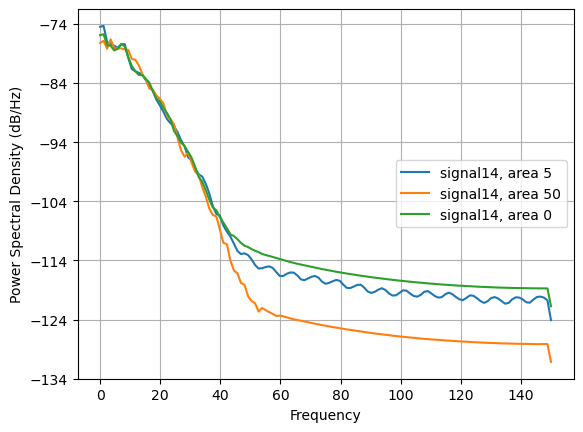

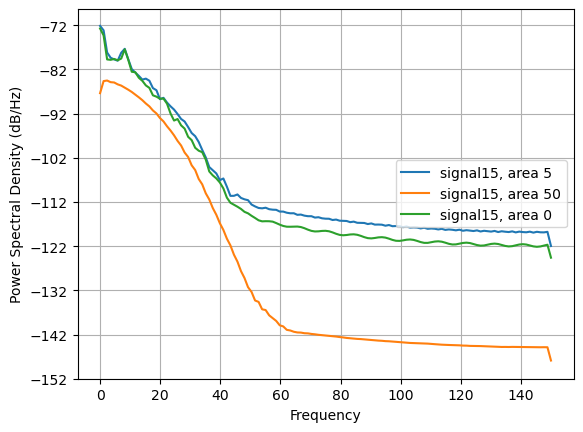

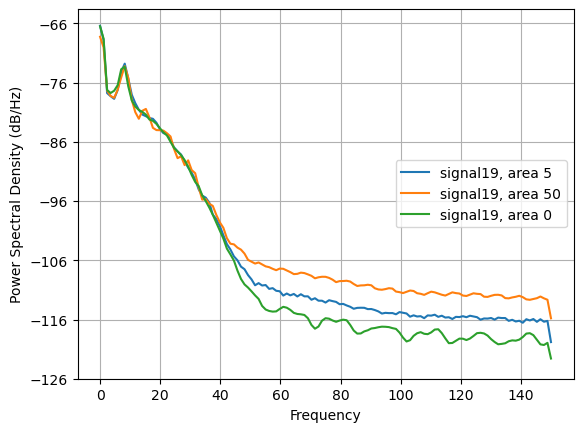

In [168]:
psds = {}
for s in signals:
    lil_dict = {}
    for a in [5, 50, 0]:
        values, psd_freqs, line = plt.psd(df_sq.loc[df_sq['near_wall']==a][s], Fs=300, return_line=True, label=s+', area '+ str(a))
        l_x, l_y = line[0].get_data()
        lil_dict[a] = [l_x, l_y]
    psds[s] = lil_dict
    plt.legend(loc='right')
    plt.show()

In [56]:
# ll = psds['signal2'][0][1][0]
# q, w = ll.get_data()
# w

In [57]:
print('signal2')
print('0, 5', str(stats.kstest(psds['signal2'][0][1], psds['signal2'][5][1])), '\n')
print('0, 50',str(stats.kstest(psds['signal2'][0][1], psds['signal2'][50][1])), '\n')
print('5, 50',str(stats.kstest(psds['signal2'][5][1], psds['signal2'][50][1])), '\n')

signal2
0, 5 KstestResult(statistic=0.3178294573643411, pvalue=3.6765826600257704e-06) 

0, 50 KstestResult(statistic=0.37209302325581395, pvalue=2.4371989119398153e-08) 

5, 50 KstestResult(statistic=0.27906976744186046, pvalue=7.888040235390397e-05) 



In [60]:
for s in ['signal12']:
    print(s)
    print('0, 5', str(stats.kstest(psds[s][0][1], psds[s][5][1])), '\n')
    print('0, 50',str(stats.kstest(psds[s][0][1], psds[s][50][1])), '\n')
    print('5, 50',str(stats.kstest(psds[s][5][1], psds[s][50][1])), '\n')


signal12
0, 5 KstestResult(statistic=0.5503875968992248, pvalue=2.6697425049345905e-18) 

0, 50 KstestResult(statistic=0.5348837209302325, pvalue=3.001574906677873e-17) 

5, 50 KstestResult(statistic=0.27906976744186046, pvalue=7.888040235390397e-05) 



In [29]:
psds[s][50][1]

array([2.67230929e-04, 1.35539793e-04, 2.08639188e-07, 1.63533947e-07,
       1.51956363e-07, 1.45788806e-07, 1.72326141e-07, 1.82346269e-07,
       1.72353465e-07, 1.52002538e-07, 1.45686240e-07, 1.60235140e-07,
       1.75191872e-07, 1.77079357e-07, 1.79919190e-07, 1.94108646e-07,
       1.81199100e-07, 1.72690037e-07, 1.84306419e-07, 1.96195668e-07,
       2.14022900e-07, 2.17356468e-07, 2.15040193e-07, 2.01221387e-07,
       1.96498646e-07, 1.80265886e-07, 1.85149172e-07, 2.03864238e-07,
       2.08295629e-07, 2.26743970e-07, 2.00301491e-07, 1.93826927e-07,
       2.37882715e-07, 2.39756421e-07, 2.43255013e-07, 2.29713684e-07,
       2.28927932e-07, 2.02343561e-07, 1.99374167e-07, 2.18891011e-07,
       2.31723122e-07, 2.35745665e-07, 2.11648402e-07, 2.07527133e-07,
       2.21592856e-07, 2.10694656e-07, 2.20729682e-07, 2.24544047e-07,
       2.11149229e-07, 2.12692657e-07, 2.11965028e-07, 2.09665674e-07,
       2.08404965e-07, 1.96826068e-07, 2.36929027e-07, 2.33991911e-07,
      

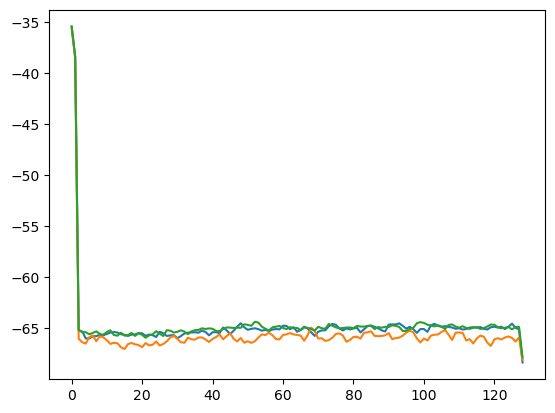

In [59]:
plt.plot(psds[s][50][1])
plt.plot(psds[s][0][1])
plt.plot(psds[s][5][1])

#### 3 check/edit resampling

edited code from '1.4 add the rest neural recordings'

In [144]:
df_sq = resampled_df.copy()

In [145]:
print(len(resampled_df)/500)

300.0


In [169]:
resampled_df

,time,x,y,signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19,near_wall,signal5second_try,signal15second_try,signal5try3
0,0.000000,31.404197,-36.597698,0.044743,0.019739,0.017624,0.024071,0.022978,0.022109,0.024222,0.023303,5.0,0.022567,0.024222,0.000001
1,0.003333,32.419092,-38.064982,0.086659,0.020051,0.017292,0.023951,0.024153,0.020838,0.022612,0.022806,50.0,0.023028,0.022612,0.000001
2,0.006667,33.155812,-39.116574,0.070304,0.019736,0.017615,0.024070,0.022961,0.022248,0.024250,0.070668,50.0,0.022564,0.024250,0.000001
3,0.010000,33.615284,-39.753567,0.067486,0.020054,0.017300,0.023951,0.024170,0.020691,0.022584,0.019456,50.0,0.023031,0.022584,0.000001
4,0.013333,33.813832,-40.000000,0.052200,0.019733,0.017607,0.024070,0.022943,0.022406,0.024279,0.025927,50.0,0.022561,0.024279,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,499.986667,23.196019,-24.580368,0.005742,0.020042,0.017255,0.023950,0.024102,0.021223,0.022686,0.022290,0.0,0.023019,0.022686,0.000001
149996,499.990000,25.090430,-27.361842,0.008837,0.019745,0.017648,0.024071,0.023012,0.021856,0.024173,0.023320,0.0,0.022573,0.024173,0.000001
149997,499.993333,26.918699,-30.044031,0.004316,0.020045,0.017269,0.023950,0.024118,0.021096,0.022663,0.022211,0.0,0.023022,0.022663,0.000001
149998,499.996667,28.616144,-32.530660,0.010446,0.019742,0.017635,0.024071,0.022996,0.021981,0.024197,0.023389,5.0,0.022570,0.024197,0.000001


###### 1.4.1 add other signal

In [154]:
# fire_time_old1 = dat1['firing_times']
# fire_time_old1

array([8.4060000e+03, 8.9690000e+03, 9.8150000e+03, ..., 4.0636307e+07,
       4.0984428e+07, 4.0996229e+07])

In [171]:
# fire_time_old

array([8.4060000e+03, 8.9690000e+03, 9.8150000e+03, ..., 4.0636307e+07,
       4.0984428e+07, 4.0996229e+07])

signal time
min 0.0
max 1366.5409666666667
dt 3.333333252025044e-05 

CPU times: total: 19.9 s
Wall time: 23 s
500.0


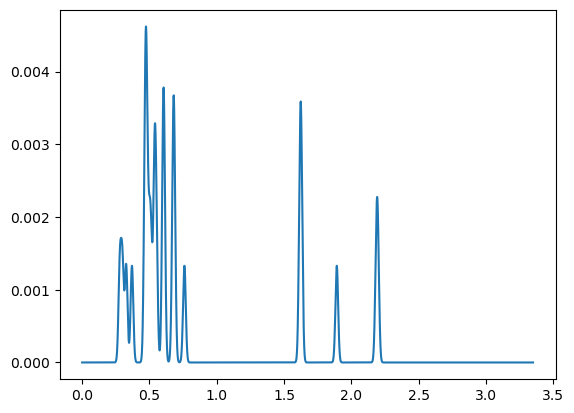

In [174]:
#firing time open
fire_time_old = df_m12_10.iloc[numb]['firing_times']
time_cut = 500

#smoothing
sigm = 0.01 * 30000
fire_time_old= fire_time_old.astype(int)
l = max(fire_time_old) + 1
signal = np.zeros(l)
signal[fire_time_old] = 1
sign_time = np.arange(len(signal))
sign_time = sign_time / 30000

print('signal time')
print('min',min(sign_time))
print('max',max(sign_time))
print('dt',max(sign_time)/len(sign_time), '\n')

sign_np = np.dstack((sign_time, signal))
sign_np = sign_np[0]
mask = (sign_np[:, 0] >= 0) & (sign_np[:, 0] <= time_cut)
sign_np = sign_np[mask, :]
sign_time = sign_np[:, 0]
signal = sign_np[:, 1]

%time signal = gaussian_filter1d(signal, sigm)

#plot

print(max(sign_time))
plt.plot(sign_time[:100500],signal[:100500])




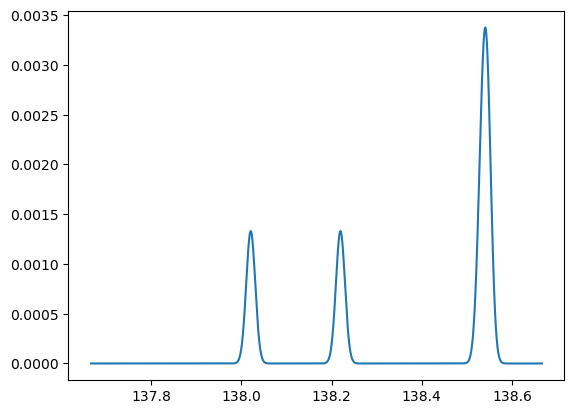

In [175]:
plt.plot(sign_time[4130000:4160000],signal[4130000:4160000])

In [176]:
num_new_points = int(len(sign_time)/100)
num_new_points

150000

In [177]:
#блин мне порю не хватает RAM для этой ячейки
#нужно взять не signal а sign_np!!!!!!!!!!!!!!!!!!!!!!!!! TODO 
%time new_sign = resample(sign_np[:,1], num_new_points, axis=0)

#resampled_dfnp = resample(tr_np[:, 1:], num_new_points, axis=0)
#new_time = np.linspace(0, time_cut,num_new_points)
#new_sign = resample(sign_np[:, 1:], num_new_points, axis=0)
resampled_df['signal'+str(int(df_mdf_m12_105_36.iloc[numb]['cluster_id']))+'second_try'] = new_sign
resampled_df

CPU times: total: 3.56 s
Wall time: 5.02 s


,time,x,y,signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19,near_wall,signal5second_try,signal15second_try,signal5try3
0,0.000000,31.404197,-36.597698,0.044743,0.019739,0.017624,0.024071,0.022978,0.022109,0.024222,0.023303,5.0,-0.000048,0.024222,0.000001
1,0.003333,32.419092,-38.064982,0.086659,0.020051,0.017292,0.023951,0.024153,0.020838,0.022612,0.022806,50.0,0.000048,0.022612,0.000001
2,0.006667,33.155812,-39.116574,0.070304,0.019736,0.017615,0.024070,0.022961,0.022248,0.024250,0.070668,50.0,-0.000048,0.024250,0.000001
3,0.010000,33.615284,-39.753567,0.067486,0.020054,0.017300,0.023951,0.024170,0.020691,0.022584,0.019456,50.0,0.000049,0.022584,0.000001
4,0.013333,33.813832,-40.000000,0.052200,0.019733,0.017607,0.024070,0.022943,0.022406,0.024279,0.025927,50.0,-0.000049,0.024279,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,499.986667,23.196019,-24.580368,0.005742,0.020042,0.017255,0.023950,0.024102,0.021223,0.022686,0.022290,0.0,0.000046,0.022686,0.000001
149996,499.990000,25.090430,-27.361842,0.008837,0.019745,0.017648,0.024071,0.023012,0.021856,0.024173,0.023320,0.0,-0.000046,0.024173,0.000001
149997,499.993333,26.918699,-30.044031,0.004316,0.020045,0.017269,0.023950,0.024118,0.021096,0.022663,0.022211,0.0,0.000047,0.022663,0.000001
149998,499.996667,28.616144,-32.530660,0.010446,0.019742,0.017635,0.024071,0.022996,0.021981,0.024197,0.023389,5.0,-0.000047,0.024197,0.000001


In [178]:
for s in ['signal5second_try','signal15second_try', 'signal5']:
    resampled_df[s] = rescale_coord(resampled_df[s], 0, 0.1)

In [179]:
resampled_df

,time,x,y,signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19,near_wall,signal5second_try,signal15second_try,signal5try3
0,0.000000,31.404197,-36.597698,0.044743,0.019739,0.017624,0.024071,0.022978,0.022109,0.024222,0.023303,5.0,0.022567,0.024222,0.000001
1,0.003333,32.419092,-38.064982,0.086659,0.020051,0.017292,0.023951,0.024153,0.020838,0.022612,0.022806,50.0,0.023028,0.022612,0.000001
2,0.006667,33.155812,-39.116574,0.070304,0.019736,0.017615,0.024070,0.022961,0.022248,0.024250,0.070668,50.0,0.022564,0.024250,0.000001
3,0.010000,33.615284,-39.753567,0.067486,0.020054,0.017300,0.023951,0.024170,0.020691,0.022584,0.019456,50.0,0.023031,0.022584,0.000001
4,0.013333,33.813832,-40.000000,0.052200,0.019733,0.017607,0.024070,0.022943,0.022406,0.024279,0.025927,50.0,0.022561,0.024279,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,499.986667,23.196019,-24.580368,0.005742,0.020042,0.017255,0.023950,0.024102,0.021223,0.022686,0.022290,0.0,0.023019,0.022686,0.000001
149996,499.990000,25.090430,-27.361842,0.008837,0.019745,0.017648,0.024071,0.023012,0.021856,0.024173,0.023320,0.0,0.022573,0.024173,0.000001
149997,499.993333,26.918699,-30.044031,0.004316,0.020045,0.017269,0.023950,0.024118,0.021096,0.022663,0.022211,0.0,0.023022,0.022663,0.000001
149998,499.996667,28.616144,-32.530660,0.010446,0.019742,0.017635,0.024071,0.022996,0.021981,0.024197,0.023389,5.0,0.022570,0.024197,0.000001


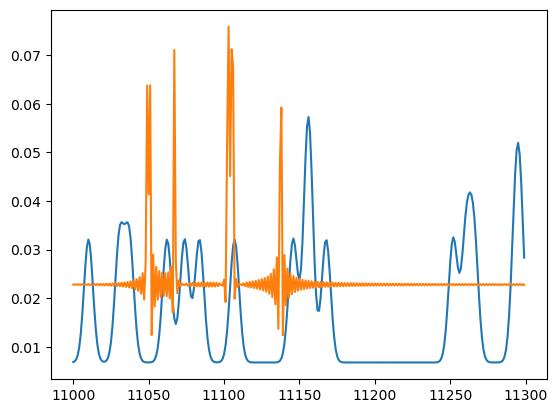

In [86]:
plt.plot(resampled_df['signal5'].iloc[11000:11300])
plt.plot(resampled_df['signal5second_try'].iloc[11000:11300])

In [85]:
resampled_df

,time,x,y,signal5,signal6,signal7,signal10,signal13,signal14,signal15,signal19,near_wall,signal5second_try,signal15second_try
0,0.000000,31.404197,-36.597698,0.044743,0.019739,0.017624,0.024071,0.022978,0.022109,0.024222,0.023303,5.0,0.022567,0.024222
1,0.003333,32.419092,-38.064982,0.086659,0.020051,0.017292,0.023951,0.024153,0.020838,0.022612,0.022806,50.0,0.023028,0.022612
2,0.006667,33.155812,-39.116574,0.070304,0.019736,0.017615,0.024070,0.022961,0.022248,0.024250,0.070668,50.0,0.022564,0.024250
3,0.010000,33.615284,-39.753567,0.067486,0.020054,0.017300,0.023951,0.024170,0.020691,0.022584,0.019456,50.0,0.023031,0.022584
4,0.013333,33.813832,-40.000000,0.052200,0.019733,0.017607,0.024070,0.022943,0.022406,0.024279,0.025927,50.0,0.022561,0.024279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,499.986667,23.196019,-24.580368,0.005742,0.020042,0.017255,0.023950,0.024102,0.021223,0.022686,0.022290,0.0,0.023019,0.022686
149996,499.990000,25.090430,-27.361842,0.008837,0.019745,0.017648,0.024071,0.023012,0.021856,0.024173,0.023320,0.0,0.022573,0.024173
149997,499.993333,26.918699,-30.044031,0.004316,0.020045,0.017269,0.023950,0.024118,0.021096,0.022663,0.022211,0.0,0.023022,0.022663
149998,499.996667,28.616144,-32.530660,0.010446,0.019742,0.017635,0.024071,0.022996,0.021981,0.024197,0.023389,5.0,0.022570,0.024197


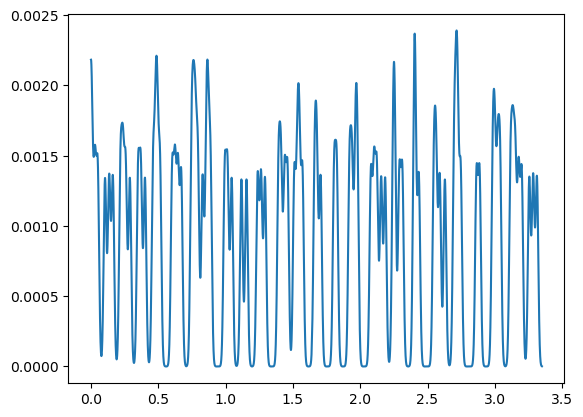

In [55]:
plt.plot(sign_time[:100500],signal[:100500])

In [57]:
resampled_df.to_pickle('')